In [13]:
import pandas as pd
import numpy as np
# No warnings about setting value on copy of slice
pd.options.mode.chained_assignment = None

# Display up to 60 columns of a dataframe
pd.set_option('display.max_columns', 60)

# Matplotlib visualization
import matplotlib.pyplot as plt
from matplotlib import rcParams
%matplotlib inline

# Internal ipython tool for setting figure size
from IPython.core.pylabtools import figsize

# Seaborn for visualization
import seaborn as sns

import warnings

warnings.filterwarnings('ignore')

config = {
    "mathtext.fontset": 'stix',
    "font.family":'DejaVu Sans',
    "font.family": 'serif',
    "font.serif": ['Arial'],
    "font.size": 24,
    'axes.unicode_minus': False
}
rcParams.update(config)
plt.rcParams['axes.unicode_minus'] = False
large = 22
med = 16
small = 12
params = {
    'axes.titlesize': large,
    'legend.fontsize': med,
    'figure.figsize': (8, 6),
    'axes.labelsize': med,
    'axes.titlesize': med,
    'xtick.labelsize': med,
    'ytick.labelsize': med,
    'figure.titlesize': large
}
plt.rcParams.update(params)
plt.rcParams['figure.dpi'] = 300
seed = 42

In [14]:
bg = pd.read_csv('./data/db_cn.csv').reset_index(drop=True)
bg

,material_id,formula_pretty,formation_energy_per_atom,energy_above_hull,is_gap_direct,band_gap,spacegroup_number,structure,formula,composition,is_GGA_U
0,mp-1113578,Cs2AgAsBr6,-1.374468,0.000000,False,1.1161,225,Full Formula (Cs2 Ag1 As1 Br6)\nReduced Formul...,Cs2AgAsBr6,Cs2 Ag1 As1 Br6,0
1,mp-1113543,Cs2AgAsCl6,-1.562978,0.008312,False,1.5886,225,Full Formula (Cs2 Ag1 As1 Cl6)\nReduced Formul...,Cs2AgAsCl6,Cs2 Ag1 As1 Cl6,0
2,mp-1114305,Cs2AgAsF6,-2.436756,0.055656,False,2.4428,225,Full Formula (Cs2 Ag1 As1 F6)\nReduced Formula...,Cs2AgAsF6,Cs2 Ag1 As1 F6,0
3,mp-1113575,Cs2AgAuBr6,-1.255402,0.024743,False,0.0000,225,Full Formula (Cs2 Ag1 Au1 Br6)\nReduced Formul...,Cs2AgAuBr6,Cs2 Ag1 Au1 Br6,0
4,mp-568448,Cs2AgAuCl6,-1.395263,0.054055,False,0.0000,225,Full Formula (Cs2 Ag1 Au1 Cl6)\nReduced Formul...,Cs2AgAuCl6,Cs2 Ag1 Au1 Cl6,0
...,...,...,...,...,...,...,...,...,...,...,...
1286,mp-1114193,Rb2YHgI6,-1.377484,0.104343,False,0.0000,225,Full Formula (Rb2 Y1 Hg1 I6)\nReduced Formula:...,Rb2YHgI6,Rb2 Y1 Hg1 I6,0
1287,mp-1114129,Rb2YInBr6,-1.954103,0.016794,True,2.8332,225,Full Formula (Rb2 Y1 In1 Br6)\nReduced Formula...,Rb2YInBr6,Rb2 Y1 In1 Br6,0
1288,mp-1114045,Rb2YInCl6,-2.216514,0.041253,False,3.3242,225,Full Formula (Rb2 Y1 In1 Cl6)\nReduced Formula...,Rb2YInCl6,Rb2 Y1 In1 Cl6,0
1289,mp-1113931,Rb2YInF6,-3.290900,0.045683,False,3.6730,225,Full Formula (Rb2 Y1 In1 F6)\nReduced Formula:...,Rb2YInF6,Rb2 Y1 In1 F6,0


In [15]:
y = bg['band_gap']

In [16]:
y.max()

8.3194

In [17]:
X = pd.read_csv('./data/features_cn.csv').reset_index(drop=True)
X

,A_Density,B_Density,C_Density,X_Density,A_dipole Polarizability,B_dipole Polarizability,C_dipole Polarizability,X_dipole Polarizability,A_covalent Radius,B_covalent Radius,C_covalent Radius,X_covalent Radius,A_atomic Radius,B_atomic Radius,C_atomic Radius,X_atomic Radius,A_FirstIonization,B_FirstIonization,C_FirstIonization,X_FirstIonization,A_number of Valence Electrons,B_number of Valence Electrons,C_number of Valence Electrons,X_number of Valence Electrons,A_number,B_number,C_number,X_number,A_Period,B_Period,...,A-B_covalent Radius,A-C_covalent Radius,(A+B+C)-X_covalent Radius,A-B_atomic Radius,A-C_atomic Radius,(A+B+C)-X_atomic Radius,A-B_FirstIonization,A-C_FirstIonization,(A+B+C)-X_FirstIonization,A-B_number of Valence Electrons,A-C_number of Valence Electrons,(A+B+C)-X_number of Valence Electrons,A-B_number,A-C_number,(A+B+C)-X_number,A-B_Period,A-C_Period,(A+B+C)-X_Period,A-B_Electronegativity,A-C_Electronegativity,(A+B+C)-X_Electronegativity,A-B_number of s+p Electrons,A-C_number of s+p Electrons,(A+B+C)-X_number of s+p Electrons,A-B_number of d Electrons,A-C_number of d Electrons,(A+B+C)-X_number of d Electrons,A-B_Mulliken EN,A-C_Mulliken EN,(A+B+C)-X_Mulliken EN
0,3.74,10.50,5.78,18.72000,801.8,55.0,30.00,126.00,464,128,121,684,5.2,1.6,1.15,6.9,751.4,731.0,947.0,6839.4,2,11,5,42,110,47,33,210,12,5,...,336,343,29,3.6,4.05,1.05,20.4,195.6,4410.0,9,3,24,63,77,20,7,8,3,0.35,0.60,12.07,1,3,34,10,0,10,0.08,0.94,31.44
1,3.74,10.50,5.78,0.01926,801.8,55.0,30.00,87.60,464,128,121,594,5.2,1.6,1.15,6.0,751.4,731.0,947.0,7507.2,2,11,5,42,110,47,33,102,12,5,...,336,343,119,3.6,4.05,1.95,20.4,195.6,5077.8,9,3,24,63,77,88,7,8,3,0.35,0.60,13.27,1,3,34,10,0,10,0.08,0.94,35.70
2,3.74,10.50,5.78,0.01020,801.8,55.0,30.00,22.44,464,128,121,384,5.2,1.6,1.15,3.0,751.4,731.0,947.0,10086.0,2,11,5,42,110,47,33,54,12,5,...,336,343,329,3.6,4.05,4.95,20.4,195.6,7656.6,9,3,24,63,77,136,7,8,9,0.35,0.60,18.19,1,3,34,10,0,10,0.08,0.94,48.36
3,3.74,10.50,19.30,18.72000,801.8,55.0,36.00,126.00,464,128,124,684,5.2,1.6,1.35,6.9,751.4,731.0,890.1,6839.4,2,11,11,42,110,47,79,210,12,5,...,336,340,32,3.6,3.85,1.25,20.4,138.7,4466.9,9,9,18,63,31,26,7,6,1,0.35,0.96,11.71,1,1,38,10,10,20,0.08,1.41,30.97
4,3.74,10.50,19.30,0.01926,801.8,55.0,36.00,87.60,464,128,124,594,5.2,1.6,1.35,6.0,751.4,731.0,890.1,7507.2,2,11,11,42,110,47,79,102,12,5,...,336,340,122,3.6,3.85,2.15,20.4,138.7,5134.7,9,9,18,63,31,134,7,6,5,0.35,0.96,12.91,1,1,38,10,10,20,0.08,1.41,35.23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1286,3.06,4.47,13.50,29.58000,639.6,162.0,33.91,197.40,420,163,133,798,4.7,1.8,1.50,8.4,806.0,600.0,1007.1,6050.4,2,3,12,42,74,39,80,318,10,5,...,257,287,82,2.9,3.20,0.40,206.0,201.1,3637.3,1,10,25,35,6,125,5,4,9,0.42,0.36,11.10,0,0,36,1,10,49,1.49,0.23,27.78
1287,3.06,4.47,7.31,18.72000,639.6,162.0,65.00,126.00,420,163,142,684,4.7,1.8,1.55,6.9,806.0,600.0,558.3,6839.4,2,3,3,42,74,39,49,210,10,5,...,257,278,41,2.9,3.15,1.15,206.0,247.7,4875.1,1,1,34,35,25,48,5,5,4,0.42,0.14,13.12,0,1,35,1,10,11,1.49,1.58,34.57
1288,3.06,4.47,7.31,0.01926,639.6,162.0,65.00,87.60,420,163,142,594,4.7,1.8,1.55,6.0,806.0,600.0,558.3,7507.2,2,3,3,42,74,39,49,102,10,5,...,257,278,131,2.9,3.15,2.05,206.0,247.7,5542.9,1,1,34,35,25,60,5,5,2,0.42,0.14,14.32,0,1,35,1,10,11,1.49,1.58,38.83
1289,3.06,4.47,7.31,0.01020,639.6,162.0,65.00,22.44,420,163,142,384,4.7,1.8,1.55,3.0,806.0,600.0,558.3,10086.0,2,3,3,42,74,39,49,54,10,5,...,257,278,341,2.9,3.15,5.05,206.0,247.7,8121.7,1,1,34,35,25,108,5,5,8,0.42,0.14,19.24,0,1,35,1,10,11,1.49,1.58,51.49


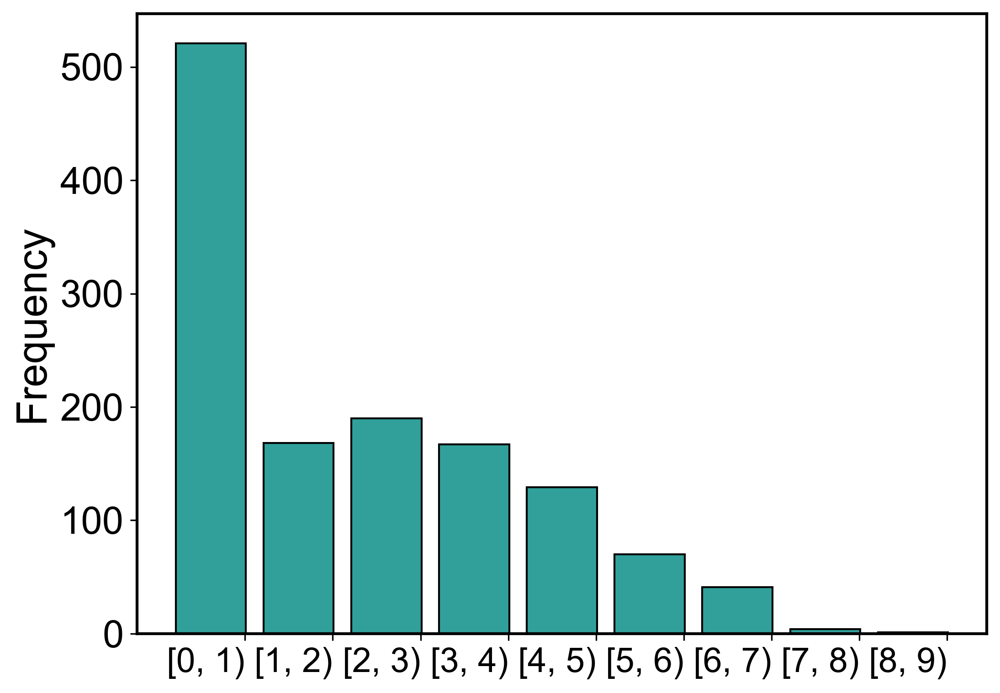

In [19]:
import numpy as np
import matplotlib.pyplot as plt

data = y
bin_edges = np.arange(0, int(np.ceil(data.max())) + 1, 1)
counts, bins, patches = plt.hist(data, bins=bin_edges, color='#31A09A', edgecolor='black', align='left', rwidth=0.8)
bin_labels = [f'[{int(bins[i])}, {int(bins[i+1])})' for i in range(len(bins)-1)]
plt.xticks(bins[:-1] + 0.39, bin_labels, rotation=0, ha='right') 
plt.xlabel('Band Gap (eV)', fontsize='22')
plt.ylabel('Frequency', fontsize='22')

ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.5)
    spine.set_edgecolor('black')
ax.xaxis.grid(False)
ax.yaxis.grid(False)
ax.tick_params(axis='x', which='major', labelsize=18) 
ax.tick_params(axis='y', which='major', labelsize=20)
ax.set_xlabel('')

#plt.savefig('./picture/band_gap_histogram.png', dpi=300, bbox_inches='tight')
plt.show()

In [7]:
#bg = pd.concat([dp['is_GGA_U'], bg], axis=1)
#bg = bg[bg['is_GGA_U'] != 1]
#bg.reset_index(inplace=True)
#bg = bg.drop(columns='index')
#dp = dp[dp['is_GGA_U'] != 1]
#dp.reset_index(inplace=True)
#dp = dp.drop(columns='index')
#dp

## Feature Engineering

In [6]:
from scipy.stats import spearmanr
def remove_collinear_features(x, y,threshold):
    '''
    Objective:
        Remove collinear features in a dataframe with a correlation coefficient
        greater than the threshold. Removing collinear features can help a model
        to generalize and improves the interpretability of the model.
        
    Inputs: 
        threshold: any features with correlations greater than this value are removed
    
    Output: 
        dataframe that contains only the non-highly-collinear features
    '''  
    # Calculate the correlation matrix
    corr_matrix = x.corr()
    iters = range(len(corr_matrix.columns) - 1)
    drop_cols = []

    # Iterate through the correlation matrix and compare correlations
    for i in iters:
        for j in range(i):
            item = corr_matrix.iloc[j:(j+1), (i+1):(i+2)]
            col = item.columns
            row = item.index
            val = abs(item.values)
            
            # If correlation exceeds the threshold
            if val >= threshold:
                # Print the correlated features and the correlation value
#                 print(col.values[0], "|", row.values[0], "|", round(val[0][0], 2))
                x1 = x[col.values[0]]
                x2 = x[row.values[0]]
                corr1,p1 = spearmanr(x1, y)
                corr2,p2 = spearmanr(x2, y)
                if np.abs(corr1) < np.abs(corr2):
                    drop_cols.append(col.values[0])
                else:
                    drop_cols.append(row.values[0])
    # Drop one of each pair of correlated columns
    drops = set(drop_cols)
    x = x.drop(columns = drops)
    return x

In [7]:
from sklearn.model_selection import train_test_split
X = remove_collinear_features(X, y, 0.8)
print(X.shape)

(1291, 27)


In [20]:
X.columns

Index(['A_Density', 'B_Density', 'C_Density', 'X_Density',
       'A_dipole Polarizability', 'B_dipole Polarizability',
       'C_dipole Polarizability', 'X_dipole Polarizability',
       'A_covalent Radius', 'B_covalent Radius', 'C_covalent Radius',
       'X_covalent Radius', 'A_atomic Radius', 'B_atomic Radius',
       'C_atomic Radius', 'X_atomic Radius', 'A_FirstIonization',
       'B_FirstIonization', 'C_FirstIonization', 'X_FirstIonization',
       'A_number of Valence Electrons', 'B_number of Valence Electrons',
       'C_number of Valence Electrons', 'X_number of Valence Electrons',
       'A_number', 'B_number', 'C_number', 'X_number', 'A_Period', 'B_Period',
       'C_Period', 'X_Period', 'A_Electronegativity', 'B_Electronegativity',
       'C_Electronegativity', 'X_Electronegativity',
       'A_number of s+p Electrons', 'B_number of s+p Electrons',
       'C_number of s+p Electrons', 'X_number of s+p Electrons',
       'A_number of d Electrons', 'B_number of d Electrons',
 

## Model Construction

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def fold5_reg(model, X, y, name='', is_plot=True):
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    models = []  
    mse_scores = []
    mae_scores = []
    r2_scores = []
    fig, ax = plt.subplots()
    for i, (train_index, test_index) in enumerate(kf.split(X, y)):
        try:
            X = X.values
            y = y.values
        except:
            pass
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        model.fit(X_train, y_train)
        models.append(model)

        y_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        print(f"Fold {i+1} MSE: {mse} MAE: {mae}  R2: {r2}")
        mse_scores.append(mse)
        mae_scores.append(mae)
        r2_scores.append(r2)

        if is_plot:
            ax.scatter(y_test, y_pred, label=f'Fold {i+1}', alpha=0.5)
            ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1.7, linestyle='--')
            ax.tick_params(axis='both', which='major', labelsize=20) 
            ax.set_xlabel(r'True $ E_{\mathrm{g}} $ (eV)',fontsize=22)
            ax.set_ylabel(r'Predicted $ E_{\mathrm{g}} $ (eV)',fontsize=22)
            #ax.set_title(f'Predictions: {name}', fontweight='bold')
            ax.legend(loc="upper left",fontsize=18)
            ax.grid(True, linestyle='--', linewidth=1, alpha=0.5)
            ax = plt.gca() 
            ax.spines['top'].set_linewidth(1.5)
            ax.spines['bottom'].set_linewidth(1.5)
            ax.spines['left'].set_linewidth(1.5)
            ax.spines['right'].set_linewidth(1.5)
            ax.grid(False)

    result = {
        'mean_squared_error': np.mean(mse_scores),
        'mean_absolute_error': np.mean(mae_scores),
        'r2_score': np.mean(r2_scores),
        'mse_std': np.std(mse_scores),
        'mae_std': np.std(mae_scores),
        'r2_std': np.std(r2_scores),
    }
    if is_plot:
        ax.text(0.95, 0.05, f'R$^2$: {result["r2_score"]:.3f}\nMAE: {result["mean_absolute_error"]:.3f}\nMSE: {result["mean_squared_error"]:.3f}',
                transform=ax.transAxes,
                verticalalignment='bottom', horizontalalignment='right',
                bbox={"boxstyle":"round", "alpha":0.5, "facecolor":"white", "edgecolor":"black"},
                fontsize=18)
        #plt.savefig('./picture/bg_reg.png', dpi=300, bbox_inches='tight')
        plt.show()
    return result, models

In [10]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import GradientBoostingRegressor

seed = 42
kn = KNeighborsRegressor()
dt = DecisionTreeRegressor(random_state=seed)
rf = RandomForestRegressor(n_jobs=-1, random_state=seed)
mlp = MLPRegressor(alpha=1, max_iter=1000, random_state=seed)
lgbm = LGBMRegressor(random_state=seed, verbose=0)
xb = XGBRegressor(random_state=seed, n_jobs=-1)
ext = ExtraTreesRegressor(n_jobs=-1, random_state=seed)
gbc = GradientBoostingRegressor(random_state=seed)


Fold 1 MSE: 0.44868920517374516 MAE: 0.31567413127413124  R2: 0.8806978799168228
Fold 2 MSE: 0.7324072519767443 MAE: 0.3893205426356589  R2: 0.8015337505513318
Fold 3 MSE: 0.8251768449224806 MAE: 0.4567662790697674  R2: 0.7703490358895121
Fold 4 MSE: 0.4589895433333333 MAE: 0.3128674418604651  R2: 0.8832718171273632
Fold 5 MSE: 0.7362708207364341 MAE: 0.33039418604651166  R2: 0.8077639769558758


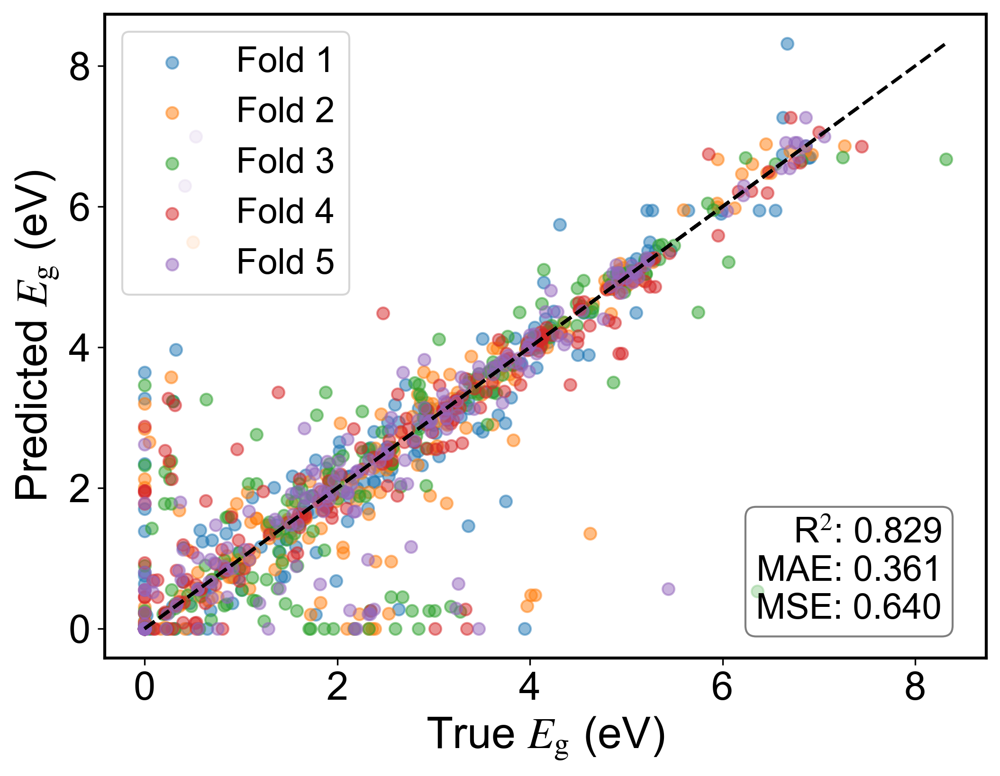

({'mean_squared_error': 0.6403067332285475,
  'mean_absolute_error': 0.3610045161773069,
  'r2_score': 0.8287232920881811,
  'mse_std': 0.15586004635695813,
  'mae_std': 0.055283137784741185,
  'r2_std': 0.04530566677680543},
 [DecisionTreeRegressor(random_state=42),
  DecisionTreeRegressor(random_state=42),
  DecisionTreeRegressor(random_state=42),
  DecisionTreeRegressor(random_state=42),
  DecisionTreeRegressor(random_state=42)])

In [13]:
fold5_reg(dt, X, y)

Fold 1 MSE: 0.3338116958658687 MAE: 0.3222271583011581  R2: 0.911242698584786
Fold 2 MSE: 0.48281802089091086 MAE: 0.3901359573643409  R2: 0.8691669402319211
Fold 3 MSE: 0.50328552860812 MAE: 0.4377628488372092  R2: 0.8599330463779928
Fold 4 MSE: 0.3344233879605387 MAE: 0.3578527558139535  R2: 0.9149509287221499
Fold 5 MSE: 0.6377923419280582 MAE: 0.38862705038759693  R2: 0.8334761342061412


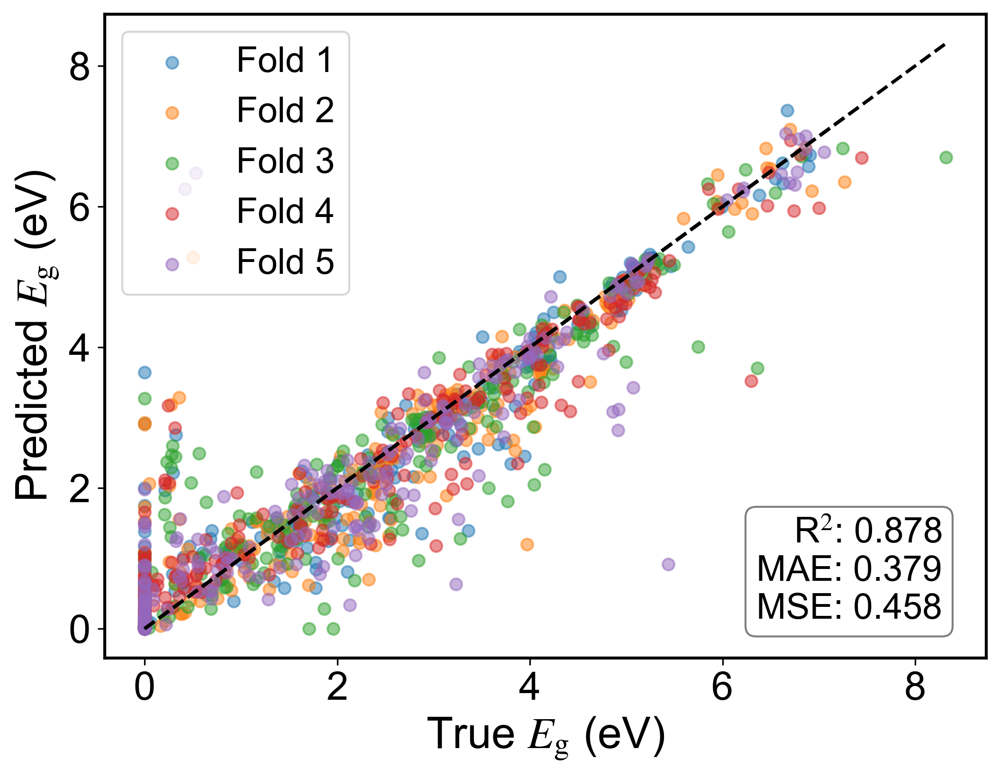

({'mean_squared_error': 0.45842619505069926,
  'mean_absolute_error': 0.37932115414085177,
  'r2_score': 0.8777539496245982,
  'mse_std': 0.11461675723382787,
  'mae_std': 0.038313464579350046,
  'r2_std': 0.031167155218171327},
 [RandomForestRegressor(n_jobs=-1, random_state=42),
  RandomForestRegressor(n_jobs=-1, random_state=42),
  RandomForestRegressor(n_jobs=-1, random_state=42),
  RandomForestRegressor(n_jobs=-1, random_state=42),
  RandomForestRegressor(n_jobs=-1, random_state=42)])

In [15]:
fold5_reg(rf, X, y)

Fold 1 MSE: 2.088707607973745 MAE: 1.096239613899614  R2: 0.44463284832395933
Fold 2 MSE: 2.0593347353720928 MAE: 1.112612635658915  R2: 0.4419656001690677
Fold 3 MSE: 2.219553753124031 MAE: 1.1713738759689922  R2: 0.3822867638174331
Fold 4 MSE: 2.3636048871736435 MAE: 1.2172042635658915  R2: 0.3988984988525197
Fold 5 MSE: 2.5372977764418603 MAE: 1.1952199224806204  R2: 0.337526328513176


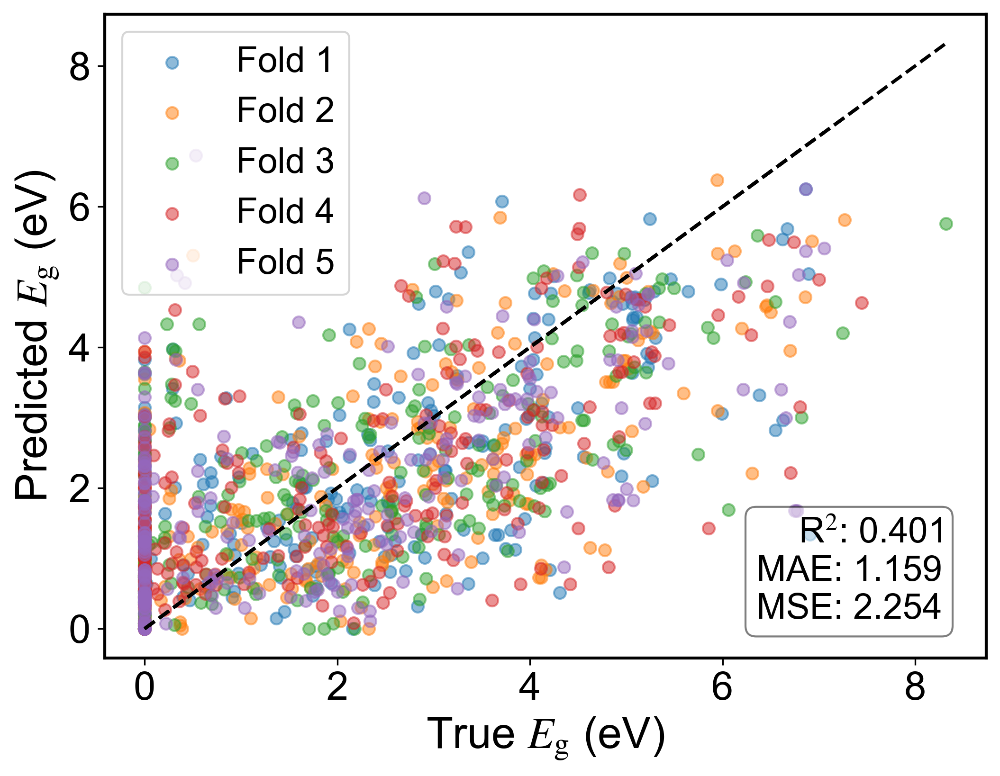

({'mean_squared_error': 2.2536997520170745,
  'mean_absolute_error': 1.1585300623148067,
  'r2_score': 0.40106200793523117,
  'mse_std': 0.17814213130152431,
  'mae_std': 0.0467809390993558,
  'r2_std': 0.039913644565907666},
 [KNeighborsRegressor(),
  KNeighborsRegressor(),
  KNeighborsRegressor(),
  KNeighborsRegressor(),
  KNeighborsRegressor()])

In [16]:
fold5_reg(kn, X, y)

Fold 1 MSE: 14.42080128942288 MAE: 3.0735673589544734  R2: -2.8343515896714395
Fold 2 MSE: 8.731321132950354 MAE: 2.215324018672181  R2: -1.3659959036609544
Fold 3 MSE: 16.598216332739085 MAE: 3.1930608467161115  R2: -3.6193690562003935
Fold 4 MSE: 7.658094891114964 MAE: 2.196468693945986  R2: -0.9475726928639028
Fold 5 MSE: 13.116234540947701 MAE: 2.7959482820021164  R2: -2.42457244597007


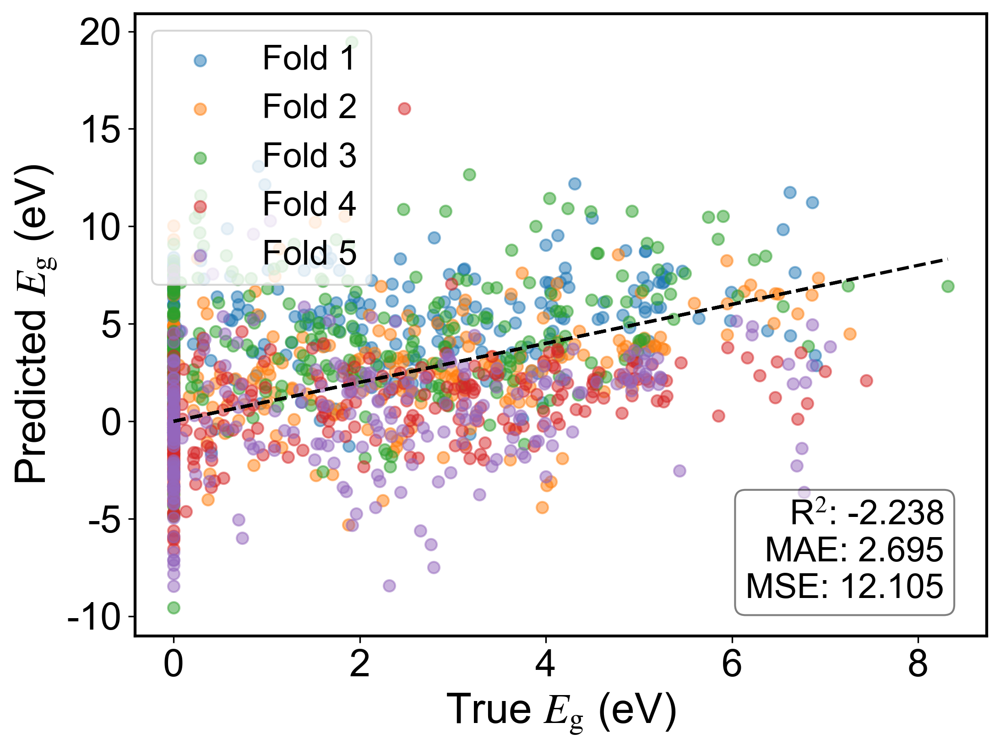

({'mean_squared_error': 12.104933637434996,
  'mean_absolute_error': 2.694873840058174,
  'r2_score': -2.238372337673352,
  'mse_std': 3.3979758105400606,
  'mae_std': 0.41956902615269076,
  'r2_std': 0.9720306632390517},
 [MLPRegressor(alpha=1, max_iter=1000, random_state=42),
  MLPRegressor(alpha=1, max_iter=1000, random_state=42),
  MLPRegressor(alpha=1, max_iter=1000, random_state=42),
  MLPRegressor(alpha=1, max_iter=1000, random_state=42),
  MLPRegressor(alpha=1, max_iter=1000, random_state=42)])

In [61]:
fold5_reg(mlp, X, y)

Fold 1 MSE: 0.289819204009641 MAE: 0.24623945559845564  R2: 0.9229398766886309
Fold 2 MSE: 0.41444048874785666 MAE: 0.3196542596899223  R2: 0.8876957468683395
Fold 3 MSE: 0.507910867310903 MAE: 0.3443926627906976  R2: 0.8586457908048781
Fold 4 MSE: 0.21079316643887216 MAE: 0.2568047480620156  R2: 0.9463920177752078
Fold 5 MSE: 0.5121579344426356 MAE: 0.29683148062015496  R2: 0.8662785462701502


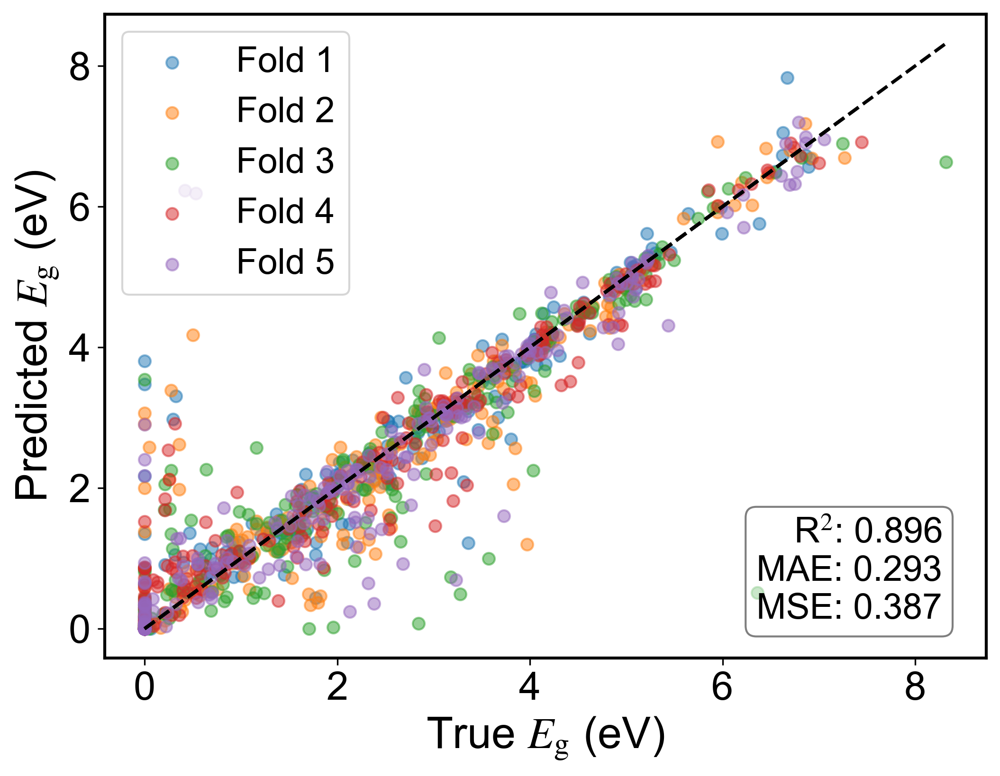

({'mean_squared_error': 0.38702433218998167,
  'mean_absolute_error': 0.2927845213522492,
  'r2_score': 0.8963903956814413,
  'mse_std': 0.11960759102433635,
  'mae_std': 0.03704793708811214,
  'r2_std': 0.03350227677038763},
 [ExtraTreesRegressor(n_jobs=-1, random_state=42),
  ExtraTreesRegressor(n_jobs=-1, random_state=42),
  ExtraTreesRegressor(n_jobs=-1, random_state=42),
  ExtraTreesRegressor(n_jobs=-1, random_state=42),
  ExtraTreesRegressor(n_jobs=-1, random_state=42)])

In [17]:
fold5_reg(ext, X, y)

Fold 1 MSE: 0.35849480281076235 MAE: 0.3335170273686928  R2: 0.9046796991749265
Fold 2 MSE: 0.5478288623212714 MAE: 0.3989156682470929  R2: 0.8515504326982198
Fold 3 MSE: 0.5747799290342849 MAE: 0.4377626594165845  R2: 0.8400357866725142
Fold 4 MSE: 0.2646896815609111 MAE: 0.31720189739848054  R2: 0.9326852953351406
Fold 5 MSE: 0.6985857387282529 MAE: 0.3980053873987768  R2: 0.817603332379602


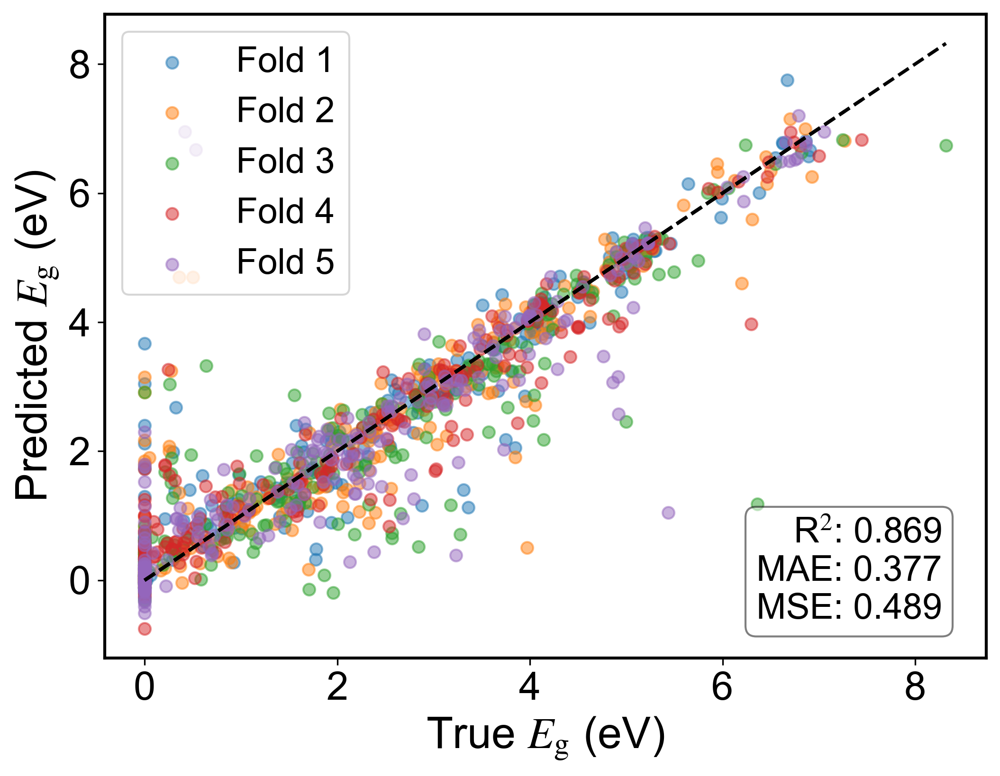

({'mean_squared_error': 0.48887580289109644,
  'mean_absolute_error': 0.3770805279659255,
  'r2_score': 0.8693109092520807,
  'mse_std': 0.15626379073377653,
  'mae_std': 0.044900274283562115,
  'r2_std': 0.04269286813392444},
 [XGBRegressor(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, device=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric=None, feature_types=None,
               gamma=None, grow_policy=None, importance_type=None,
               interaction_constraints=None, learning_rate=None, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=None, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               multi_strategy=None, n_estimators=None, n_jobs=-1,
               num_parallel_tree=None, random_state=42, ...),
  XGBRe

In [18]:
fold5_reg(xb, X, y)

Fold 1 MSE: 0.3407439421745917 MAE: 0.35643098419556424  R2: 0.9093994813376736
Fold 2 MSE: 0.4745925632230325 MAE: 0.4082736951973098  R2: 0.8713958582675312
Fold 3 MSE: 0.5492519764508539 MAE: 0.44837036378963496  R2: 0.847140347299276
Fold 4 MSE: 0.29846325019778286 MAE: 0.37116666570904056  R2: 0.9240961513048086
Fold 5 MSE: 0.5460486817551796 MAE: 0.4226889411637779  R2: 0.8574298695361731


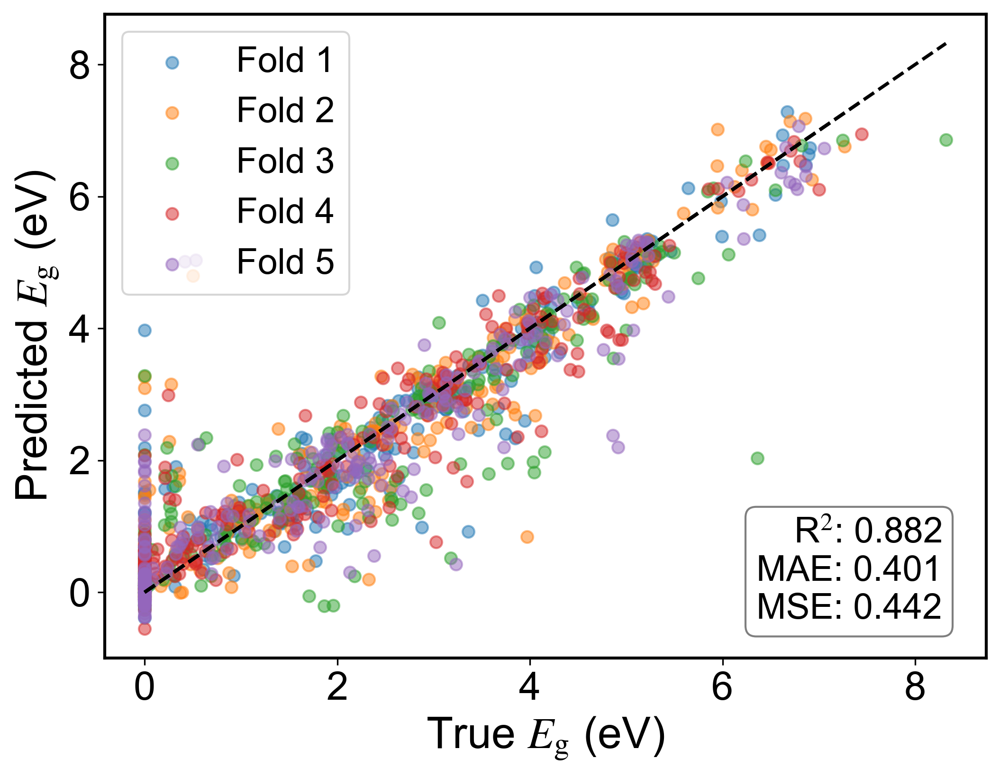

({'mean_squared_error': 0.4418200827602881,
  'mean_absolute_error': 0.4013861300110655,
  'r2_score': 0.8818923415490925,
  'mse_std': 0.10416027625166277,
  'mae_std': 0.033594486746954484,
  'r2_std': 0.029846588079200806},
 [LGBMRegressor(random_state=42, verbose=0),
  LGBMRegressor(random_state=42, verbose=0),
  LGBMRegressor(random_state=42, verbose=0),
  LGBMRegressor(random_state=42, verbose=0),
  LGBMRegressor(random_state=42, verbose=0)])

In [19]:
fold5_reg(lgbm, X, y)

Fold 1 MSE: 0.3338116958658687 MAE: 0.3222271583011581  R2: 0.911242698584786
Fold 2 MSE: 0.48281802089091097 MAE: 0.39013595736434087  R2: 0.8691669402319211
Fold 3 MSE: 0.5032855286081201 MAE: 0.4377628488372092  R2: 0.8599330463779928
Fold 4 MSE: 0.3344233879605387 MAE: 0.3578527558139535  R2: 0.9149509287221499
Fold 5 MSE: 0.6377923419280583 MAE: 0.38862705038759693  R2: 0.8334761342061412


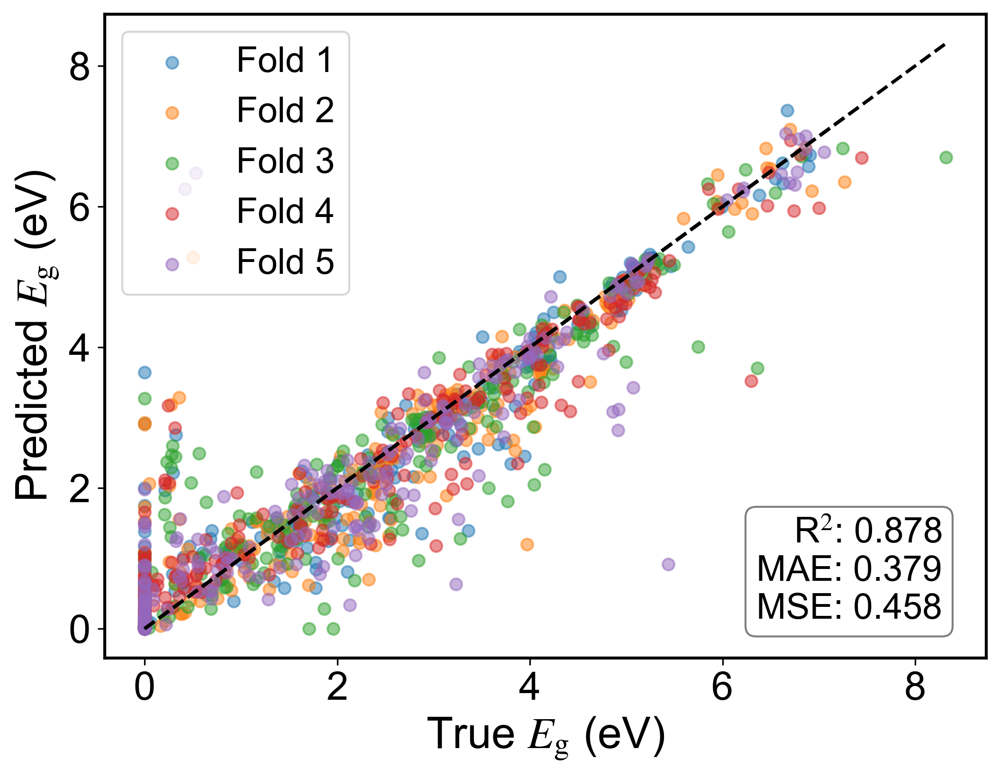

({'mean_squared_error': 0.45842619505069937,
  'mean_absolute_error': 0.37932115414085177,
  'r2_score': 0.8777539496245982,
  'mse_std': 0.11461675723382793,
  'mae_std': 0.03831346457935004,
  'r2_std': 0.031167155218171327},
 [RandomForestRegressor(n_jobs=-1, random_state=42),
  RandomForestRegressor(n_jobs=-1, random_state=42),
  RandomForestRegressor(n_jobs=-1, random_state=42),
  RandomForestRegressor(n_jobs=-1, random_state=42),
  RandomForestRegressor(n_jobs=-1, random_state=42)])

In [20]:
fold5_reg(rf, X, y)

## Optimal feature subset and model

In [13]:
df1 = pd.concat([X,y], axis=1)

In [14]:
def init_population(n,c):
    return np.array([[math.ceil(e) for e in pop] for pop in (np.random.rand(n,c)-0.5)]), np.zeros((2,c))-1

def single_point_crossover(population):
    r,c, n = population.shape[0], population.shape[1], np.random.randint(1,population.shape[1])         
    for i in range(0,r,2):                
        population[i], population[i+1] = np.append(population[i][0:n],population[i+1][n:c]),np.append(population[i+1][0:n],population[i][n:c])        
    return population

def flip_mutation(population):
    return population.max() - population

def random_selection(population):
    r = population.shape[0]
    new_population = population.copy()    
    for i in range(r):        
        new_population[i] = population[np.random.randint(0,r)]
    return new_population
def predictive_model_cv(X, y, model, selected_features):

    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    r2_scores = []
    
    for train_index, test_index in kf.split(X, y):
        X_train, X_test = X.iloc[train_index][selected_features], X.iloc[test_index][selected_features]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        mdl = model
        mdl.fit(X_train, y_train)
        y_pred = mdl.predict(X_test)
        score = r2_score(y_test, y_pred)
        r2_scores.append(score)

    return np.mean(r2_scores)
def individual_fitness_cv(individual, data, feature_list, target, model):
    selected_features = [feature_list[j] for j in range(individual.shape[0]) if individual[j] == 1]
    return predictive_model_cv(data[selected_features], data[target], model, selected_features)

def get_fitness_cv(data, feature_list, target, population, model):
    fitness = Parallel(n_jobs=-1)(delayed(individual_fitness_cv)(individual, data, feature_list, target, model) for individual in population)
    return np.array(fitness)
    
def memorize(pop, memory):      
    return np.append(memory, pop.reshape(1, memory.shape[1]), axis=0)

def replace_duplicate(population, memory):    
    for i in range(population.shape[0]):         
        counter = 0                
        while any(np.all(memory == population[i], axis=1)) and (counter < 100): 
            population[i] = np.array([math.ceil(k) for k in (np.random.rand(population.shape[1]) - 0.5)])                    
            counter += 1                    
        memory = memorize(population[i], memory)   
    return population, memory
def ga(data, feature_list, target, n, max_iter,model):
    
    c = len(feature_list)
    population, memory = init_population(n,c)
    population, memory = replace_duplicate(population, memory)    
    
    fitness = get_fitness_cv(data, feature_list, target, population, model)
    optimal_value = max(fitness)
    optimal_solution = population[np.where(fitness == optimal_value)][0]    
    
    for i in range(max_iter): 
        start = time()
        population = random_selection(population)
        population = single_point_crossover(population)
        if np.random.rand() < 0.3:
            population = flip_mutation(population)
        
        population, memory = replace_duplicate(population, memory)
        fitness = get_fitness_cv(data, feature_list, target, population, model)
        
        if max(fitness) > optimal_value:
            optimal_value = max(fitness)
            optimal_solution = population[np.where(fitness == optimal_value)][0]
        end = time()
        print(f"The {i+1}th iteration T = {end - start:.4f}second")                               
        
    return optimal_solution, optimal_value

In [17]:
from time import time
import math
from sklearn.metrics import roc_auc_score,accuracy_score,f1_score,r2_score,matthews_corrcoef,classification_report,roc_curve, auc
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.model_selection import KFold
from joblib import Parallel, delayed
model = ExtraTreesRegressor(random_state=seed,n_jobs=-1)
target = 'band_gap'
feature_list = [i for i in df1.columns if i != target]
start = time()
feature_set, optimize_accuracy = ga(df1, feature_list, target, 10, 1000, model)
end = time()
print(f"operating time T = {end - start:.4f}秒")

feature_set = [feature_list[i] for i in range(len(feature_list)) if feature_set[i] == 1]

print('Optimal Feature Set\n', feature_set, '\nOptimal Accuracy =', round(optimize_accuracy * 100), '%')

The 1th iteration T = 2.5254second
The 2th iteration T = 2.6150second
The 3th iteration T = 2.5762second
The 4th iteration T = 2.5850second
The 5th iteration T = 2.5375second
The 6th iteration T = 2.5733second
The 7th iteration T = 2.5905second
The 8th iteration T = 2.6022second
The 9th iteration T = 2.5571second
The 10th iteration T = 2.8456second
The 11th iteration T = 2.1699second
The 12th iteration T = 1.9846second
The 13th iteration T = 2.1382second
The 14th iteration T = 2.2415second
The 15th iteration T = 2.2415second
The 16th iteration T = 2.2601second
The 17th iteration T = 1.8971second
The 18th iteration T = 2.0345second
The 19th iteration T = 1.8198second
The 20th iteration T = 1.7453second
The 21th iteration T = 3.4432second
The 22th iteration T = 3.8059second
The 23th iteration T = 2.6147second
The 24th iteration T = 2.4456second
The 25th iteration T = 2.9748second
The 26th iteration T = 3.2691second
The 27th iteration T = 3.1248second
The 28th iteration T = 2.7384second
T

The 229th iteration T = 1.8597second
The 230th iteration T = 1.7915second
The 231th iteration T = 1.8928second
The 232th iteration T = 1.9395second
The 233th iteration T = 1.7597second
The 234th iteration T = 1.8518second
The 235th iteration T = 1.8414second
The 236th iteration T = 1.7693second
The 237th iteration T = 1.7880second
The 238th iteration T = 1.8594second
The 239th iteration T = 1.8310second
The 240th iteration T = 1.8738second
The 241th iteration T = 1.8595second
The 242th iteration T = 1.9003second
The 243th iteration T = 1.8215second
The 244th iteration T = 1.8723second
The 245th iteration T = 1.8794second
The 246th iteration T = 1.7741second
The 247th iteration T = 1.9266second
The 248th iteration T = 1.8016second
The 249th iteration T = 1.9095second
The 250th iteration T = 1.8623second
The 251th iteration T = 1.8315second
The 252th iteration T = 1.8306second
The 253th iteration T = 1.8407second
The 254th iteration T = 1.8900second
The 255th iteration T = 1.7997second
T

The 514th iteration T = 2.0713second
The 515th iteration T = 2.0583second
The 516th iteration T = 2.0768second
The 517th iteration T = 2.2140second
The 518th iteration T = 2.2839second
The 519th iteration T = 2.0713second
The 520th iteration T = 1.9679second
The 521th iteration T = 2.0289second
The 522th iteration T = 2.0062second
The 523th iteration T = 2.0528second
The 524th iteration T = 2.2202second
The 525th iteration T = 2.0132second
The 526th iteration T = 2.0546second
The 527th iteration T = 2.2338second
The 528th iteration T = 2.2421second
The 529th iteration T = 2.2816second
The 530th iteration T = 2.1925second
The 531th iteration T = 2.2142second
The 532th iteration T = 2.2005second
The 533th iteration T = 2.1119second
The 534th iteration T = 2.1498second
The 535th iteration T = 2.0953second
The 536th iteration T = 2.0403second
The 537th iteration T = 2.0657second
The 538th iteration T = 2.0488second
The 539th iteration T = 2.0157second
The 540th iteration T = 2.2115second
T

The 736th iteration T = 2.0151second
The 737th iteration T = 2.0849second
The 738th iteration T = 2.1073second
The 739th iteration T = 2.1114second
The 740th iteration T = 2.1075second
The 741th iteration T = 2.0897second
The 742th iteration T = 2.1397second
The 743th iteration T = 2.0880second
The 744th iteration T = 2.3382second
The 745th iteration T = 2.0036second
The 746th iteration T = 2.3463second
The 747th iteration T = 2.2416second
The 748th iteration T = 2.2039second
The 749th iteration T = 2.1270second
The 750th iteration T = 2.0773second
The 751th iteration T = 2.1047second
The 752th iteration T = 2.2212second
The 753th iteration T = 2.0473second
The 754th iteration T = 2.1260second
The 755th iteration T = 2.0740second
The 756th iteration T = 2.0720second
The 757th iteration T = 2.0961second
The 758th iteration T = 2.0634second
The 759th iteration T = 2.0546second
The 760th iteration T = 2.1170second
The 761th iteration T = 2.2482second
The 762th iteration T = 2.3292second
T

The 958th iteration T = 2.1614second
The 959th iteration T = 2.1006second
The 960th iteration T = 2.1592second
The 961th iteration T = 1.9966second
The 962th iteration T = 2.0996second
The 963th iteration T = 2.1536second
The 964th iteration T = 2.0509second
The 965th iteration T = 2.0656second
The 966th iteration T = 2.0398second
The 967th iteration T = 2.1517second
The 968th iteration T = 2.1152second
The 969th iteration T = 2.1619second
The 970th iteration T = 2.1317second
The 971th iteration T = 2.1183second
The 972th iteration T = 2.0889second
The 973th iteration T = 2.0672second
The 974th iteration T = 2.0972second
The 975th iteration T = 2.0979second
The 976th iteration T = 2.1123second
The 977th iteration T = 2.0295second
The 978th iteration T = 1.9876second
The 979th iteration T = 2.0418second
The 980th iteration T = 2.0576second
The 981th iteration T = 2.1926second
The 982th iteration T = 2.0367second
The 983th iteration T = 1.9884second
The 984th iteration T = 2.2618second
T

In [21]:
#ext
#Optimal Feature Set
feature_ext = ['C_covalent Radius', 'C_FirstIonization', 'X_number of Valence Electrons',
               'C_number', 'A_Electronegativity', 'A_number of s+p Electrons',
               'B_number of s+p Electrons', '(A+B+C)-X_Density', 'A-C_number of Valence Electrons',
               'A-C_Electronegativity', '(A+B+C)-X_Electronegativity', 'A-B_number of s+p Electrons',
               'A-C_number of s+p Electrons', '(A+B+C)-X_number of d Electrons']
 

In [22]:
X_ext = X[feature_ext]

Fold 1 MSE: 0.25985160820154035 MAE: 0.23566044401544375  R2: 0.9309079705774013
Fold 2 MSE: 0.3974038520567908 MAE: 0.3018894651162789  R2: 0.8923123005386776
Fold 3 MSE: 0.39304067224517436 MAE: 0.3155828100775194  R2: 0.890614757465452
Fold 4 MSE: 0.18439226310481407 MAE: 0.2136117364341087  R2: 0.9531061782983434
Fold 5 MSE: 0.4601886532239884 MAE: 0.27816678682170565  R2: 0.8798474229125002


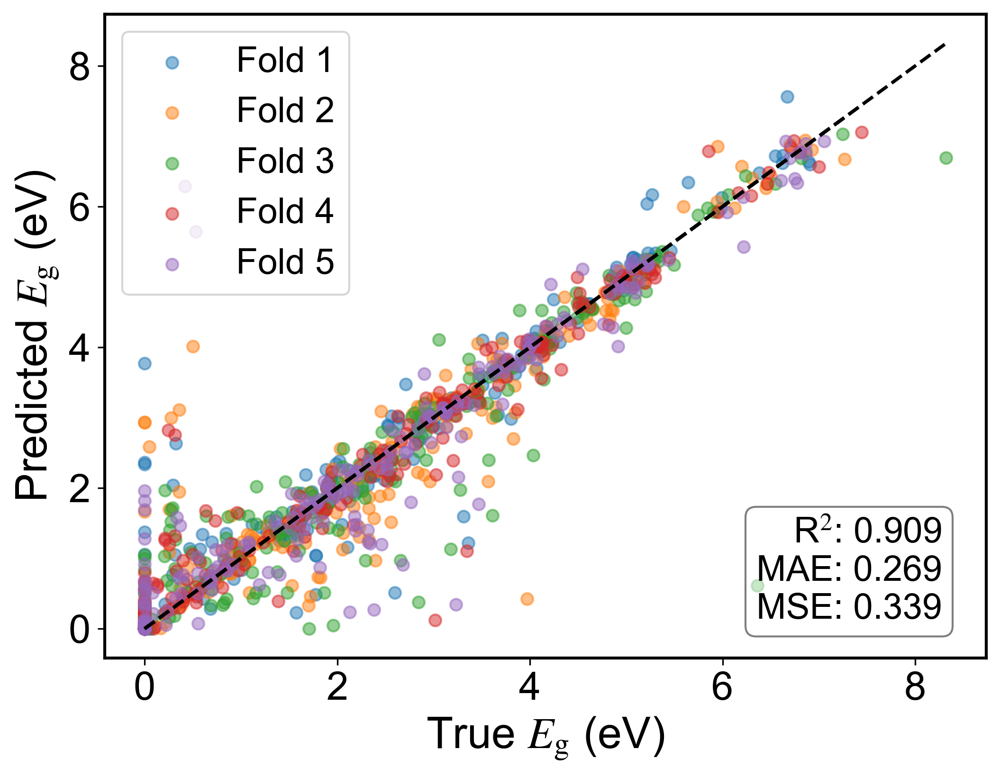

{'mean_squared_error': 0.33897540976646157,
 'mean_absolute_error': 0.2689822484930113,
 'r2_score': 0.909357725958475,
 'mse_std': 0.10117915899112974,
 'mae_std': 0.03876877416039813,
 'r2_std': 0.027896392264258465}

In [25]:
#!!!!!!!!!!!!!!
ext_result, ext_models = fold5_reg(ext, X_ext ,y)
ext_result

## Model effect

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn import metrics
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def fold5_reg_mae(model, X, y, name='', is_plot=True, error_threshold=0):

    original_index = y.index if hasattr(y, 'index') else np.arange(len(y))
    
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    models = []  
    mse_scores = []
    mae_scores = []
    r2_scores = []
    
    all_y_true = np.zeros(len(y)) * np.nan
    all_y_pred = np.zeros(len(y)) * np.nan
    all_y_ae = np.zeros(len(y)) * np.nan  
    
    fig, ax = plt.subplots(figsize=(10, 8))
    
    for i, (train_index, test_index) in enumerate(kf.split(X, y)):
        try:
            X_values = X.values
            y_values = y.values
        except:
            X_values = X
            y_values = y
        
        X_train, X_test = X_values[train_index], X_values[test_index]
        y_train, y_test = y_values[train_index], y_values[test_index]
        
        model.fit(X_train, y_train)
        models.append(model)
        
        y_pred = model.predict(X_test)
        all_y_true[test_index] = y_test
        all_y_pred[test_index] = y_pred
        all_y_ae[test_index] = np.abs(y_test - y_pred)  
        
        mse = mean_squared_error(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        
        print(f"Fold {i+1} MSE: {mse:.4f} MAE: {mae:.4f}  R2: {r2:.4f}")

        mse_scores.append(mse)
        mae_scores.append(mae)
        r2_scores.append(r2)
        
        if is_plot:
            ax.scatter(y_test, y_pred, label=f'Fold {i+1}', alpha=0.5)

    if is_plot:
        min_val = min(np.nanmin(all_y_true), np.nanmin(all_y_pred))
        max_val = max(np.nanmax(all_y_true), np.nanmax(all_y_pred))
        ax.plot([min_val, max_val], [min_val, max_val], 'k--', lw=1.7, linestyle='--')

        ax.tick_params(axis='both', which='major', labelsize=20)
        ax.set_xlabel(r'True $E_{\mathrm{g}}$ (eV)', fontsize=22)
        ax.set_ylabel(r'Predicted $E_{\mathrm{g}}$ (eV)', fontsize=22)
        ax.legend(loc="upper left", fontsize=18)
        ax.grid(True, linestyle='--', linewidth=1, alpha=0.5)

        for spine in ax.spines.values():
            spine.set_linewidth(1.5)

        overall_mse = np.nanmean(mse_scores)
        overall_mae = np.nanmean(all_y_ae)  
        overall_r2 = r2_score(all_y_true, all_y_pred)
        
        ax.text(0.95, 0.05, 
                f'R$^2$: {overall_r2:.3f}\nMAE: {overall_mae:.3f}\nMSE: {overall_mse:.3f}',
                transform=ax.transAxes,
                verticalalignment='bottom', horizontalalignment='right',
                bbox={"boxstyle":"round", "alpha":0.5, "facecolor":"white", "edgecolor":"black"},
                fontsize=18)
        
        #plt.savefig('./picture/bg_reg.png', dpi=300, bbox_inches='tight')
        plt.show()
    
    result = {
        'mean_squared_error': np.mean(mse_scores),
        'mean_absolute_error': np.mean(mae_scores),
        'r2_score': np.mean(r2_scores),
        'mse_std': np.std(mse_scores),
        'mae_std': np.std(mae_scores),
        'r2_std': np.std(r2_scores),
    }
    
    # Screen for high-error samples (MAE > threshold)
    high_error_mask = all_y_ae > error_threshold
    high_error_indices = np.where(high_error_mask)[0]
    
    high_error_df = pd.DataFrame({
        'true_value': all_y_true[high_error_mask],
        'predicted_value': all_y_pred[high_error_mask],
        'absolute_error': all_y_ae[high_error_mask],
        'squared_error': (all_y_true[high_error_mask] - all_y_pred[high_error_mask])**2
    }, index=original_index[high_error_mask])
    
    # Sort in descending order by absolute error
    high_error_df = high_error_df.sort_values(by='absolute_error', ascending=False)
    
    return result, models, high_error_df

Fold 1 MSE: 0.2599 MAE: 0.2357  R2: 0.9309
Fold 2 MSE: 0.3974 MAE: 0.3019  R2: 0.8923
Fold 3 MSE: 0.3930 MAE: 0.3156  R2: 0.8906
Fold 4 MSE: 0.1844 MAE: 0.2136  R2: 0.9531
Fold 5 MSE: 0.4602 MAE: 0.2782  R2: 0.8798


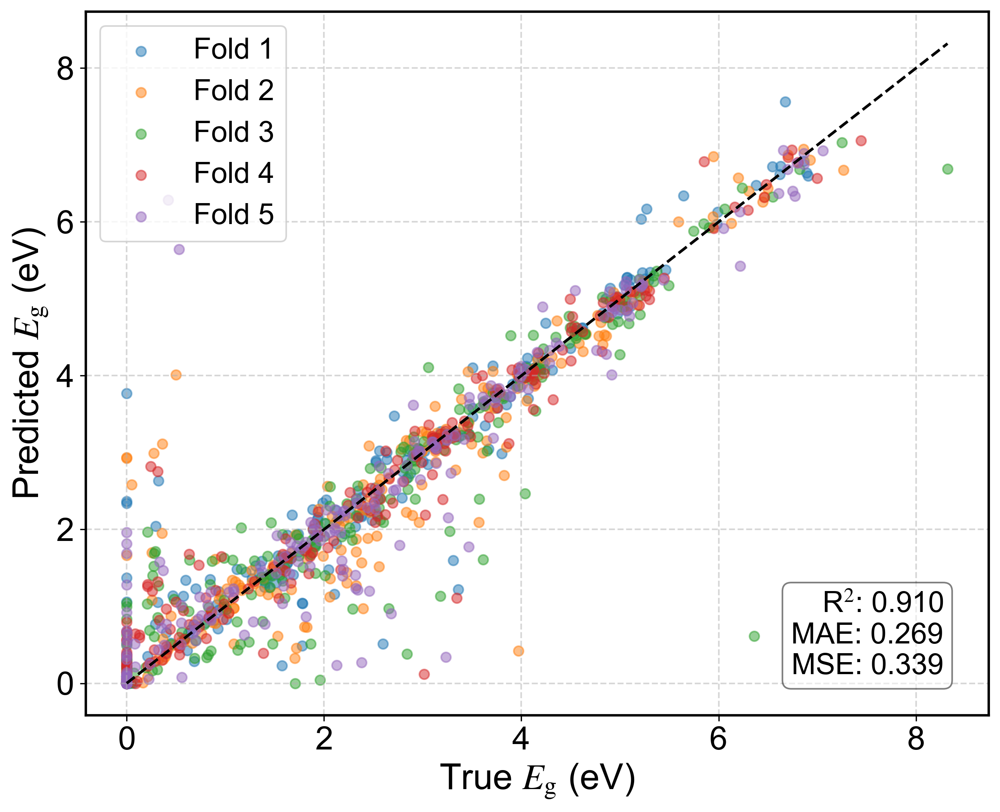

,true_value,predicted_value,absolute_error,squared_error
91,0.4187,6.286877,5.868177,3.443550e+01
228,6.3611,0.614059,5.747041,3.302848e+01
166,0.5299,5.641997,5.112097,2.613354e+01
43,0.0000,3.768631,3.768631,1.420258e+01
1131,3.9696,0.422624,3.546976,1.258104e+01
...,...,...,...,...
106,5.2294,5.229665,0.000265,7.022500e-08
381,0.0000,0.000208,0.000208,4.326400e-08
434,0.0000,0.000208,0.000208,4.326400e-08
384,0.0000,0.000208,0.000208,4.326400e-08


In [29]:
ext_result2, ext_models2, high_error_samples = fold5_reg_mae(ext, X_ext ,y)
high_error_samples

In [30]:
high_error_samples.index = high_error_samples.index.astype(bg.index.dtype)

high_error_samples['formula'] = bg.loc[high_error_samples.index, 'formula_pretty']
high_error_samples['true_bandgap'] = bg.loc[high_error_samples.index, 'band_gap'] 

column_order = ['formula', 'true_bandgap', 'predicted_value', 'squared_error', 'absolute_error']
high_error_samples = high_error_samples[column_order]

high_error_samples = high_error_samples.sort_values(by='squared_error', ascending=False)

In [31]:
high_error_samples

,formula,true_bandgap,predicted_value,squared_error,absolute_error
91,Cs2KCeF6,0.4187,6.286877,3.443550e+01,5.868177
228,Cs2NaCeF6,6.3611,0.614059,3.302848e+01,5.747041
166,Cs2LiCeF6,0.5299,5.641997,2.613354e+01,5.112097
43,Cs2EuAgCl6,0.0000,3.768631,1.420258e+01,3.768631
1131,Rb2NaCeCl6,3.9696,0.422624,1.258104e+01,3.546976
...,...,...,...,...,...
106,Cs2KHoCl6,5.2294,5.229665,7.022500e-08,0.000265
381,Cs2TlAuBr6,0.0000,0.000208,4.326400e-08,0.000208
434,K2AgAuBr6,0.0000,0.000208,4.326400e-08,0.000208
384,Cs2TlAuI6,0.0000,0.000208,4.326400e-08,0.000208


In [32]:
from pymatgen.core.composition import Composition

def get_elements_from_composition(composition):
    comp = Composition(composition)
    elements = comp.elements
    return [str(element) for element in elements]

high_error_samples['elements'] = high_error_samples['formula'].apply(get_elements_from_composition)
high_error_samples['A'] = high_error_samples['elements'].apply(lambda x: x[0] if len(x) >= 1 else None)
high_error_samples['B'] = high_error_samples['elements'].apply(lambda x: x[1] if len(x) >= 2 else None)
high_error_samples['C'] = high_error_samples['elements'].apply(lambda x: x[2] if len(x) >= 3 else None)
high_error_samples['X'] = high_error_samples['elements'].apply(lambda x: x[3] if len(x) >= 4 else None)

In [33]:
high_error_samples

,formula,true_bandgap,predicted_value,squared_error,absolute_error,elements,A,B,C,X
91,Cs2KCeF6,0.4187,6.286877,3.443550e+01,5.868177,"[Cs, K, Ce, F]",Cs,K,Ce,F
228,Cs2NaCeF6,6.3611,0.614059,3.302848e+01,5.747041,"[Cs, Na, Ce, F]",Cs,Na,Ce,F
166,Cs2LiCeF6,0.5299,5.641997,2.613354e+01,5.112097,"[Cs, Li, Ce, F]",Cs,Li,Ce,F
43,Cs2EuAgCl6,0.0000,3.768631,1.420258e+01,3.768631,"[Cs, Eu, Ag, Cl]",Cs,Eu,Ag,Cl
1131,Rb2NaCeCl6,3.9696,0.422624,1.258104e+01,3.546976,"[Rb, Na, Ce, Cl]",Rb,Na,Ce,Cl
...,...,...,...,...,...,...,...,...,...,...
106,Cs2KHoCl6,5.2294,5.229665,7.022500e-08,0.000265,"[Cs, K, Ho, Cl]",Cs,K,Ho,Cl
381,Cs2TlAuBr6,0.0000,0.000208,4.326400e-08,0.000208,"[Cs, Tl, Au, Br]",Cs,Tl,Au,Br
434,K2AgAuBr6,0.0000,0.000208,4.326400e-08,0.000208,"[K, Ag, Au, Br]",K,Ag,Au,Br
384,Cs2TlAuI6,0.0000,0.000208,4.326400e-08,0.000208,"[Cs, Tl, Au, I]",Cs,Tl,Au,I


In [38]:
a_counts = high_error_samples['A'].value_counts()
b_counts = high_error_samples['B'].value_counts()
c_counts = high_error_samples['C'].value_counts()
x_counts = high_error_samples['X'].value_counts()

In [39]:
a_counts,b_counts,c_counts,x_counts

(A
 Cs    389
 K     324
 Rb    264
 Na    115
 Li     20
 Name: count, dtype: int64,
 B
 Na    210
 Li    203
 Rb    119
 Tl    108
 K      75
 Ag     64
 Cu     53
 Y      43
 Sc     39
 In     30
 Hg     28
 Pr     23
 Ce     21
 Mn     10
 Co      9
 Fe      8
 Cr      8
 Tm      8
 Sm      7
 La      7
 Nb      7
 Eu      7
 V       7
 Dy      7
 Ti      6
 Ni      4
 Ca      1
 Name: count, dtype: int64,
 C
 Ag    117
 Cu     95
 Sb     80
 Bi     79
 In     66
 As     62
 Mo     60
 Y      39
 Hg     39
 Ga     37
 Au     36
 Tl     34
 Ce     34
 Pr     33
 Nd     32
 Sc     31
 Al     21
 Rh     17
 Ir     16
 Cr     14
 La     12
 Tb     12
 Er     12
 Sm     11
 Ru     11
 Dy     11
 Co     10
 Lu     10
 Tm     10
 Pd     10
 Gd     10
 Ta      9
 Fe      9
 Ni      7
 Eu      6
 N       5
 V       5
 Ho      4
 Mn      2
 Sn      1
 Nb      1
 U       1
 Ti      1
 Name: count, dtype: int64,
 X
 F     429
 Cl    349
 Br    186
 I     148
 Name: count, dtype: int64)

In [40]:
from collections import Counter

combined_elements = pd.concat([
    high_error_samples['B'],
    high_error_samples['C']
])
combined_counts = Counter(combined_elements)
combined_df = pd.DataFrame.from_dict(combined_counts, orient='index', columns=['count']).sort_values(by='count', ascending=False)

In [41]:
combined_df

,count
Na,210
Li,203
Ag,181
Cu,148
Tl,142
Rb,119
In,96
Y,82
Sb,80
Bi,79


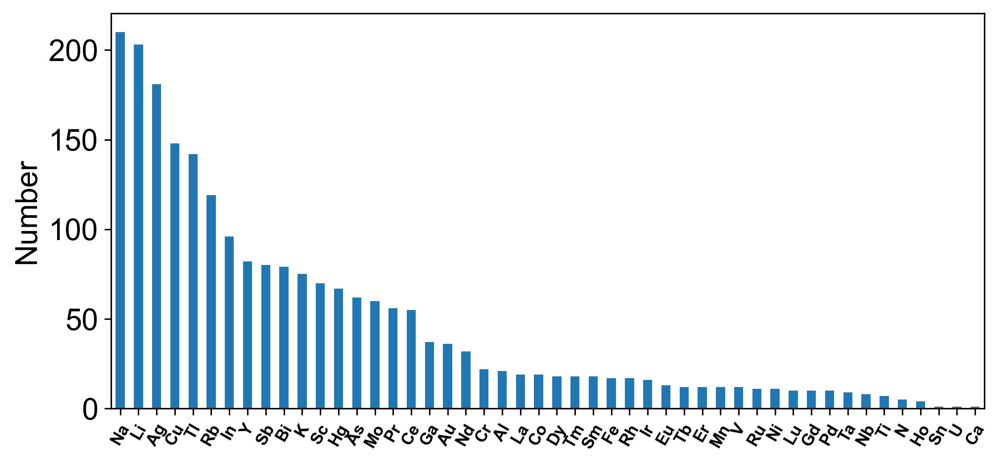

In [60]:
combined_df.plot(kind='bar', figsize=(8, 4), legend=False)
#plt.xlabel("Element")
plt.ylabel("Number")
plt.xticks(rotation=60, ha='center',fontsize=9,fontweight='bold')
plt.tick_params(axis='x', rotation=60)
plt.tight_layout()
plt.savefig('./bg_reg_mae_all.png', dpi=300, bbox_inches='tight')
plt.show()

In [115]:
X_xgb = X[feature_xgb]

Fold 1 MSE: 0.3018390255335301 MAE: 0.30188870954479097  R2: 0.9197439223971384
Fold 2 MSE: 0.3871359974374646 MAE: 0.32507801341351494  R2: 0.895094663207373
Fold 3 MSE: 0.4182089467920732 MAE: 0.3581707257026561  R2: 0.8836102970879487
Fold 4 MSE: 0.16823651886634527 MAE: 0.23738763484736658  R2: 0.9572148354459901
Fold 5 MSE: 0.4251278867585151 MAE: 0.30944945673440666  R2: 0.8890015848327837


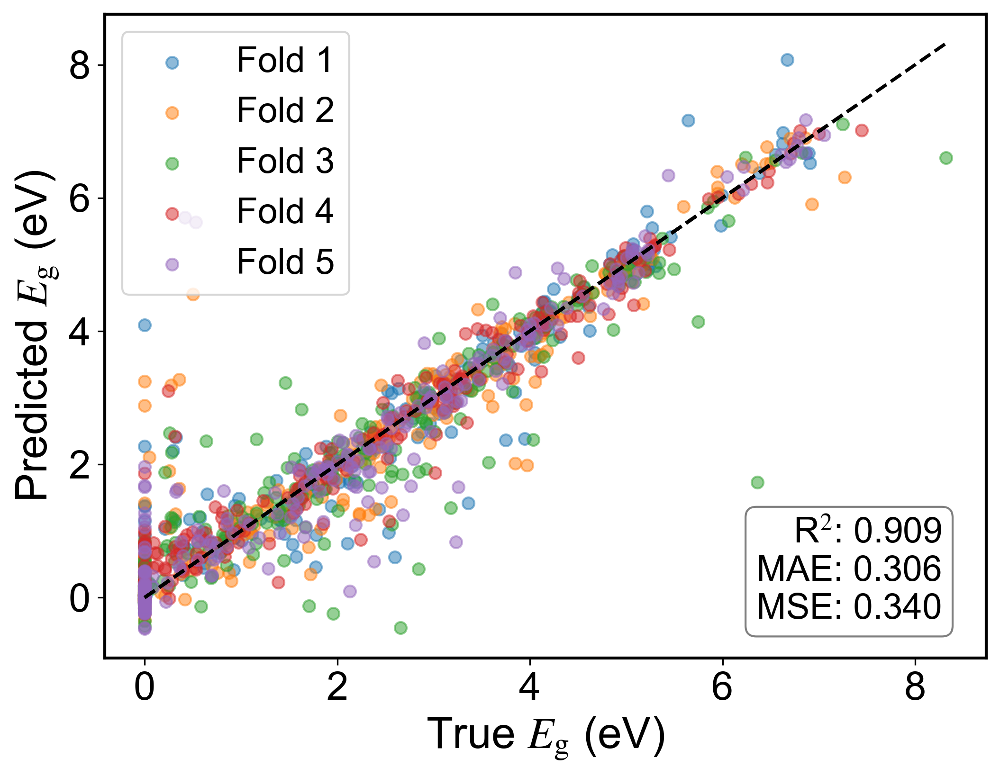

{'mean_squared_error': 0.34010967507758566,
 'mean_absolute_error': 0.3063949080485471,
 'r2_score': 0.9089330605942468,
 'mse_std': 0.09648221804766854,
 'mae_std': 0.03955106463073262,
 'r2_std': 0.027121990471270285}

In [116]:
xgb_result, xgb_models = fold5_reg(xb, X_xgb ,y)
xgb_result

In [ ]:
##############################################

In [27]:
#ext
#Optimal Feature Set
feature_ext = ['C_covalent Radius', 'C_FirstIonization', 'X_number of Valence Electrons', 'C_number', 'A_Electronegativity', 'A_number of s+p Electrons', 'B_number of s+p Electrons', '(A+B+C)-X_Density', 'A-C_number of Valence Electrons', 'A-C_Electronegativity', '(A+B+C)-X_Electronegativity', 'A-B_number of s+p Electrons', 'A-C_number of s+p Electrons', '(A+B+C)-X_number of d Electrons']
 

In [9]:
from joblib import load

ext_models = load('./model/ext_models_bg.joblib')

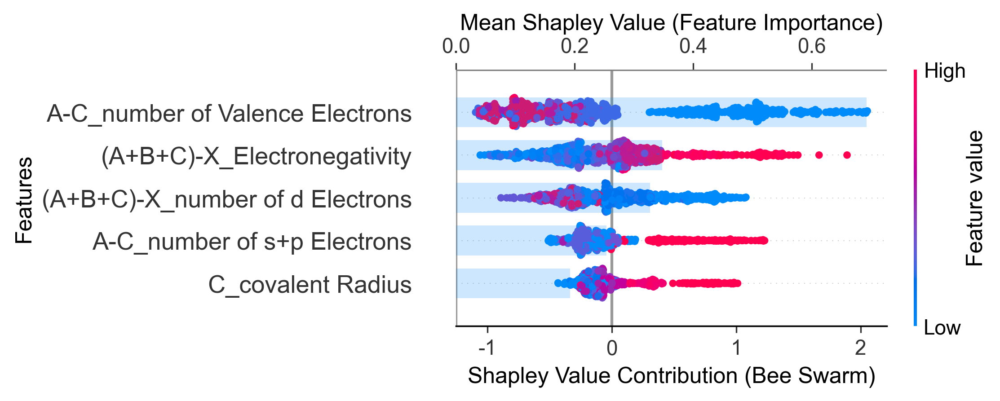

In [40]:
shap.summary_plot(shap_values, test, plot_type="dot", show=False,max_display=5,color_bar=True)

ax1 = plt.gca()
ax2 = ax1.twiny()
shap.summary_plot(shap_values, test, plot_type="bar", show=False,max_display=5)
plt.gca().set_position([0.2, 0.2, 0.65, 0.65])  
ax2.axhline(y=5, color='gray', linestyle='-', linewidth=1.5) 
bars = ax2.patches  

for bar in bars:    
    bar.set_alpha(0.2)  

ax1.set_xlabel('Shapley Value Contribution (Bee Swarm)', fontsize=12)
ax2.set_xlabel('Mean Shapley Value (Feature Importance)', fontsize=12)
ax2.xaxis.set_ticks_position('top') 
ax2.xaxis.set_label_position('top')
plt.subplots_adjust(
    left=0.2,    
    right=0.75,  
    top=0.85,    
    bottom=0.15  
)
ax1.set_ylabel('Features', fontsize=12)
plt.tight_layout()
plt.savefig('./picture/bgreg_shap.png', bbox_inches='tight')
plt.show()

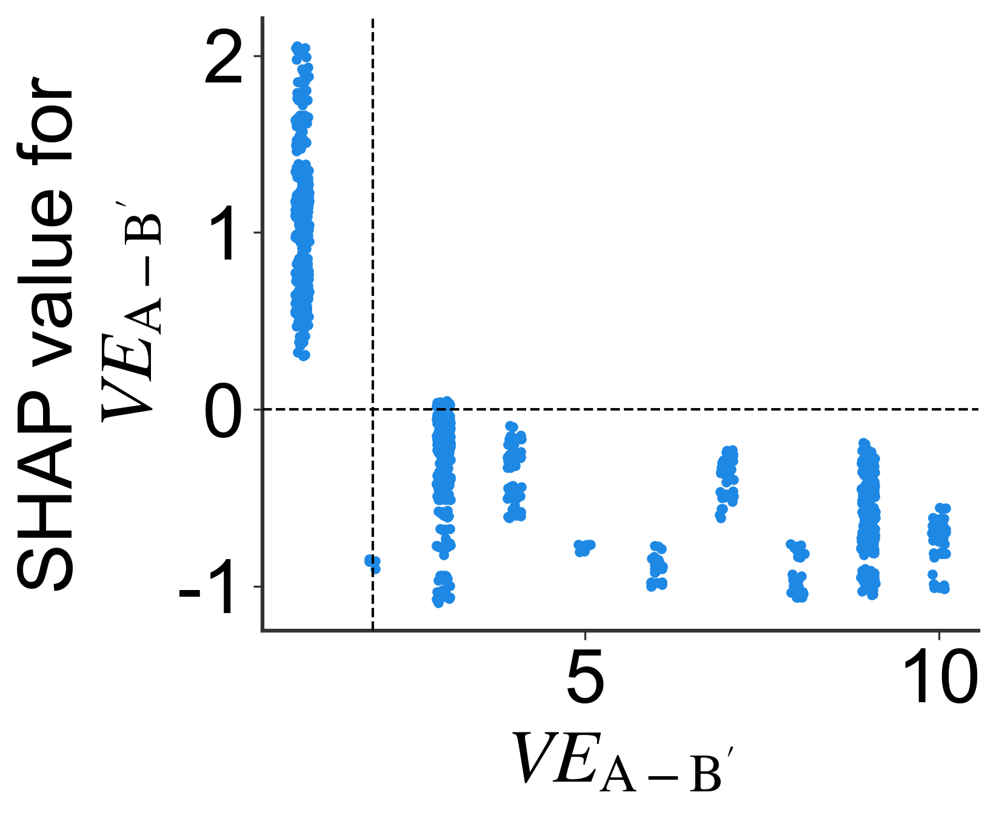

In [102]:
shap.plots.scatter(shap_values[:, 'A-C_number of Valence Electrons'], hist=False,show=False)
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.5)
ax.tick_params(axis='both', which='major', labelsize=30)
plt.setp(ax.get_xticklabels(), fontweight=550,color='black')  
plt.setp(ax.get_yticklabels(), fontweight=550,color='black') 
ax.set_ylabel("SHAP value for \n $VE_{\mathrm{A-B'}}$", fontsize=30,fontweight=550,color='black')
ax.set_xlabel(r"$VE_{\mathrm{A-B'}}$", fontsize=30,fontweight=550,color='black')
plt.tight_layout()
ax.axhline(y=0,color='black',linestyle='--',linewidth=1,zorder=3)
ax.axvline(x=2,color='black',linestyle='--',linewidth=1,zorder=3)
plt.savefig("./picture/bgreg_shap1.png", dpi=300, bbox_inches="tight")
plt.show()

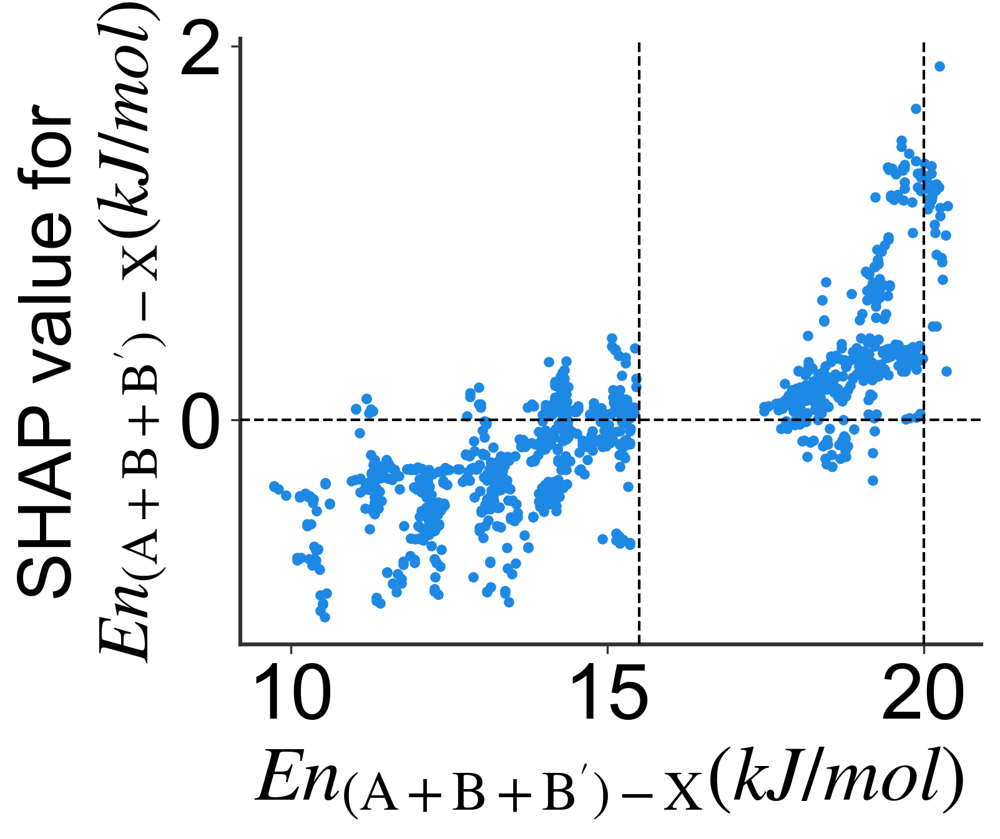

In [103]:
shap.plots.scatter(shap_values[:, '(A+B+C)-X_Electronegativity'], hist=False,show=False)
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.5)
ax.tick_params(axis='both', which='major', labelsize=30)
plt.setp(ax.get_xticklabels(), fontweight=550,color='black')  # x轴加粗
plt.setp(ax.get_yticklabels(), fontweight=550,color='black') 
ax.set_ylabel("SHAP value for \n $En_{\mathrm{(A+B+B')-X}} (kJ/mol)$", fontsize=28,fontweight=550,color='black')
ax.set_xlabel(r"$En_{\mathrm{(A+B+B')-X}} (kJ/mol)$ ", fontsize=30,fontweight=550,color='black')
plt.tight_layout()
ax.axhline(y=0,color='black',linestyle='--',linewidth=1,zorder=3)
ax.axvline(x=15.5,color='black',linestyle='--',linewidth=1,zorder=3)
ax.axvline(x=20,color='black',linestyle='--',linewidth=1,zorder=3)
plt.savefig("./picture/bgreg_shap2.png", dpi=300, bbox_inches="tight")
plt.show()

# predict bandgap values and screen candidates

In [11]:
from joblib import load

ext_models = load('./model/ext_models_bg.joblib')

In [4]:
#ext
#Optimal Feature Set
feature_ext = ['C_covalent Radius', 'C_FirstIonization', 'X_number of Valence Electrons', 'C_number', 'A_Electronegativity', 'A_number of s+p Electrons', 'B_number of s+p Electrons', '(A+B+C)-X_Density', 'A-C_number of Valence Electrons', 'A-C_Electronegativity', '(A+B+C)-X_Electronegativity', 'A-B_number of s+p Electrons', 'A-C_number of s+p Electrons', '(A+B+C)-X_number of d Electrons']

In [5]:
data = pd.read_csv('./data/data_tf.csv')
data

,formula,number,A_Density,B_Density,C_Density,X_Density,A_dipole Polarizability,B_dipole Polarizability,C_dipole Polarizability,X_dipole Polarizability,A_covalent Radius,B_covalent Radius,C_covalent Radius,X_covalent Radius,A_atomic Radius,B_atomic Radius,C_atomic Radius,X_atomic Radius,A_FirstIonization,B_FirstIonization,C_FirstIonization,X_FirstIonization,A_number of Valence Electrons,B_number of Valence Electrons,C_number of Valence Electrons,X_number of Valence Electrons,A_number,B_number,C_number,X_number,...,A-B_covalent Radius,A-C_covalent Radius,(A+B+C)-X_covalent Radius,A-B_atomic Radius,A-C_atomic Radius,(A+B+C)-X_atomic Radius,A-B_FirstIonization,A-C_FirstIonization,(A+B+C)-X_FirstIonization,A-B_number of Valence Electrons,A-C_number of Valence Electrons,(A+B+C)-X_number of Valence Electrons,A-B_number,A-C_number,(A+B+C)-X_number,A-B_Period,A-C_Period,(A+B+C)-X_Period,A-B_Electronegativity,A-C_Electronegativity,(A+B+C)-X_Electronegativity,A-B_number of s+p Electrons,A-C_number of s+p Electrons,(A+B+C)-X_number of s+p Electrons,A-B_number of d Electrons,A-C_number of d Electrons,(A+B+C)-X_number of d Electrons,A-B_Mulliken EN,A-C_Mulliken EN,(A+B+C)-X_Mulliken EN
0,Li2NaBF6,1,1.068,0.971,2.34000,0.0102,328.225,162.7000,20.5,22.44,266,155,85,384,2.9,1.80,0.85,3.0,1040.4,495.8,800.6,10086.0,2,1,3,42,6,11,5,54,...,111,181,122,1.10,2.05,2.55,544.6,239.8,7749.2,1,1,36,5,1,32,1,2,3,1.03,0.08,18.95,1,1,36,0,0,0,3.17,1.73,49.30
1,Li2NaNF6,1,1.068,0.971,0.00125,0.0102,328.225,162.7000,7.4,22.44,266,155,71,384,2.9,1.80,0.65,3.0,1040.4,495.8,1402.3,10086.0,2,1,5,42,6,11,7,54,...,111,195,108,1.10,2.25,2.35,544.6,361.9,7147.5,1,3,34,5,1,30,1,2,3,1.03,1.08,17.95,1,3,34,0,0,0,3.17,1.28,46.29
2,Li2CuAlF6,1,1.068,8.960,2.70000,0.0102,328.225,46.5000,57.8,22.44,266,112,126,384,2.9,1.35,1.25,3.0,1040.4,745.5,577.5,10086.0,2,11,3,42,6,29,13,54,...,154,140,120,1.55,1.65,2.50,294.9,462.9,7722.6,9,1,26,23,7,6,0,1,1,0.06,0.35,18.41,1,1,36,10,0,10,1.54,2.79,48.73
3,Li2CuPF6,1,1.068,8.960,1.82000,0.0102,328.225,46.5000,25.0,22.44,266,112,111,384,2.9,1.35,1.00,3.0,1040.4,745.5,1011.8,10086.0,2,11,5,42,6,29,15,54,...,154,155,105,1.55,1.90,2.25,294.9,28.6,7288.3,9,3,24,23,9,4,0,1,1,0.06,0.23,17.83,1,3,34,10,0,10,1.54,0.40,46.34
4,Li2CuCrF6,1,1.068,8.960,7.15000,0.0102,328.225,46.5000,83.0,22.44,266,112,122,384,2.9,1.35,1.40,3.0,1040.4,745.5,652.9,10086.0,2,11,6,42,6,29,24,54,...,154,144,116,1.55,1.50,2.65,294.9,387.5,7647.2,9,4,23,23,18,5,0,0,0,0.06,0.30,18.36,1,1,38,10,5,15,1.54,2.30,48.24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9081,Nd2LiCuF6,3,14.020,0.534,8.96000,0.0102,416.000,164.1125,46.5,22.44,348,133,112,384,3.7,1.45,1.35,3.0,1066.2,520.2,745.5,10086.0,6,1,11,42,120,3,29,54,...,215,236,209,2.25,2.35,3.50,546.0,320.7,7754.1,5,5,24,117,91,98,10,8,6,1.30,0.38,18.72,3,3,36,0,10,10,3.19,1.72,48.77
9082,Nd2NaCuF6,3,14.020,0.971,8.96000,0.0102,416.000,162.7000,46.5,22.44,348,155,112,384,3.7,1.80,1.35,3.0,1066.2,495.8,745.5,10086.0,6,1,11,42,120,11,29,54,...,193,236,231,1.90,2.35,3.85,570.4,320.7,7778.5,5,5,24,109,91,106,9,8,7,1.35,0.38,18.77,3,3,36,0,10,10,3.35,1.72,48.93
9083,Eu2LiCuF6,3,10.480,0.534,8.96000,0.0102,368.000,164.1125,46.5,22.44,336,133,112,384,3.7,1.45,1.35,3.0,1094.2,520.2,745.5,10086.0,6,1,11,42,126,3,29,54,...,203,224,197,2.25,2.35,3.50,574.0,348.7,7726.1,5,5,24,123,97,104,10,8,6,1.42,0.50,18.60,3,3,36,0,10,10,3.19,1.72,48.77
9084,Tm2LiCuF6,3,18.640,0.534,8.96000,0.0102,288.000,164.1125,46.5,22.44,328,133,112,384,3.5,1.45,1.35,3.0,1193.4,520.2,745.5,10086.0,6,1,11,42,138,3,29,54,...,195,216,189,2.05,2.15,3.30,673.2,447.9,7626.9,5,5,24,135,109,116,10,8,6,1.52,0.60,18.50,3,3,36,0,10,10,3.19,1.72,48.77


In [6]:
screen1 = pd.read_csv('./data/screen_bandgaptype.csv')
screen1

,formula,number
0,Na2LiAuF6,1
1,Na2LiYbF6,1
2,K2LiInCl6,1
3,K2LiAuF6,1
4,K2LiYbF6,1
...,...,...
858,Tl2CaCrBr6,2
859,Tl2CaGeBr6,2
860,Tl2CaNbBr6,2
861,Tl2CaTmBr6,2


In [7]:
screen1 = pd.merge(screen1, data, on=['formula','number'], how='left')
screen1

,formula,number,A_Density,B_Density,C_Density,X_Density,A_dipole Polarizability,B_dipole Polarizability,C_dipole Polarizability,X_dipole Polarizability,A_covalent Radius,B_covalent Radius,C_covalent Radius,X_covalent Radius,A_atomic Radius,B_atomic Radius,C_atomic Radius,X_atomic Radius,A_FirstIonization,B_FirstIonization,C_FirstIonization,X_FirstIonization,A_number of Valence Electrons,B_number of Valence Electrons,C_number of Valence Electrons,X_number of Valence Electrons,A_number,B_number,C_number,X_number,...,A-B_covalent Radius,A-C_covalent Radius,(A+B+C)-X_covalent Radius,A-B_atomic Radius,A-C_atomic Radius,(A+B+C)-X_atomic Radius,A-B_FirstIonization,A-C_FirstIonization,(A+B+C)-X_FirstIonization,A-B_number of Valence Electrons,A-C_number of Valence Electrons,(A+B+C)-X_number of Valence Electrons,A-B_number,A-C_number,(A+B+C)-X_number,A-B_Period,A-C_Period,(A+B+C)-X_Period,A-B_Electronegativity,A-C_Electronegativity,(A+B+C)-X_Electronegativity,A-B_number of s+p Electrons,A-C_number of s+p Electrons,(A+B+C)-X_number of s+p Electrons,A-B_number of d Electrons,A-C_number of d Electrons,(A+B+C)-X_number of d Electrons,A-B_Mulliken EN,A-C_Mulliken EN,(A+B+C)-X_Mulliken EN
0,Na2LiAuF6,1,1.942,0.534,19.30,0.01020,325.4,164.1125,36.0,22.44,310,133,124,384,3.6,1.45,1.35,3.0,991.6,520.2,890.1,10086.0,2,1,11,42,22,3,79,54,...,177,186,183,2.15,2.25,3.40,471.4,101.5,7684.1,1,9,28,19,57,50,4,0,2,0.88,0.68,18.50,1,1,38,0,10,10,2.69,0.07,47.98
1,Na2LiYbF6,1,1.942,0.534,6.97,0.01020,325.4,164.1125,139.0,22.44,310,133,170,384,3.6,1.45,1.75,3.0,991.6,520.2,603.4,10086.0,2,1,3,42,22,3,70,54,...,177,140,229,2.15,1.85,3.80,471.4,388.2,7970.8,1,1,36,19,48,41,4,0,2,0.88,0.76,19.94,1,0,37,0,0,0,2.69,2.60,50.65
2,K2LiInCl6,1,1.724,0.534,7.31,0.01926,579.4,164.1125,65.0,87.60,392,133,142,594,4.4,1.45,1.55,6.0,837.6,520.2,558.3,7507.2,2,1,3,42,38,3,49,102,...,259,250,73,2.95,2.85,1.40,317.4,279.3,5591.1,1,1,36,35,11,12,6,3,3,0.66,0.14,14.56,1,1,36,0,10,10,1.83,1.74,38.85
3,K2LiAuF6,1,1.724,0.534,19.30,0.01020,579.4,164.1125,36.0,22.44,392,133,124,384,4.4,1.45,1.35,3.0,837.6,520.2,890.1,10086.0,2,1,11,42,38,3,79,54,...,259,268,265,2.95,3.05,4.20,317.4,52.5,7838.1,1,9,28,35,41,66,6,2,4,0.66,0.90,18.72,1,1,38,0,10,10,1.83,0.93,48.84
4,K2LiYbF6,1,1.724,0.534,6.97,0.01020,579.4,164.1125,139.0,22.44,392,133,170,384,4.4,1.45,1.75,3.0,837.6,520.2,603.4,10086.0,2,1,3,42,38,3,70,54,...,259,222,311,2.95,2.65,4.60,317.4,234.2,8124.8,1,1,36,35,32,57,6,2,4,0.66,0.54,20.16,1,0,37,0,0,0,1.83,1.74,51.51
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
858,Tl2CaCrBr6,2,23.800,1.540,7.15,18.72000,100.0,160.8000,83.0,126.00,288,171,122,684,3.8,1.80,1.40,6.9,1178.8,589.8,652.9,6839.4,6,2,6,42,162,20,24,210,...,117,166,103,2.00,2.40,0.10,589.0,525.9,4417.9,4,0,28,142,138,4,8,8,4,3.08,2.42,11.02,4,5,33,20,15,25,4.20,2.68,33.22
859,Tl2CaGeBr6,2,23.800,1.540,5.32,18.72000,100.0,160.8000,40.0,126.00,288,171,121,684,3.8,1.80,1.25,6.9,1178.8,589.8,762.0,6839.4,6,2,4,42,162,20,32,210,...,117,167,104,2.00,2.55,0.05,589.0,416.8,4308.8,4,2,30,142,130,4,8,8,4,3.08,2.07,10.67,4,2,30,20,20,20,4.20,1.80,32.34
860,Tl2CaNbBr6,2,23.800,1.540,8.57,18.72000,100.0,160.8000,98.0,126.00,288,171,147,684,3.8,1.80,1.45,6.9,1178.8,589.8,652.1,6839.4,6,2,5,42,162,20,41,210,...,117,141,78,2.00,2.35,0.15,589.0,526.7,4418.7,4,1,29,142,121,13,8,7,3,3.08,2.48,11.08,4,5,33,20,16,24,4.20,2.40,32.94
861,Tl2CaTmBr6,2,23.800,1.540,9.32,18.72000,100.0,160.8000,144.0,126.00,288,171,164,684,3.8,1.80,1.75,6.9,1178.8,589.8,596.7,6839.4,6,2,3,42,162,20,69,210,...,117,124,61,2.00,2.05,0.45,589.0,582.1,4474.1,4,3,31,142,93,41,8,6,2,3.08,2.83,11.43,4,4,32,20,20,20,4.20,3.30,33.84


In [8]:
X1 = screen1[feature_ext]
X1

,C_covalent Radius,C_FirstIonization,X_number of Valence Electrons,C_number,A_Electronegativity,A_number of s+p Electrons,B_number of s+p Electrons,(A+B+C)-X_Density,A-C_number of Valence Electrons,A-C_Electronegativity,(A+B+C)-X_Electronegativity,A-B_number of s+p Electrons,A-C_number of s+p Electrons,(A+B+C)-X_number of d Electrons
0,124,890.1,42,79,1.86,2,1,21.76580,9,0.68,18.50,1,1,10
1,170,603.4,42,70,1.86,2,1,9.43580,1,0.76,19.94,1,0,0
2,142,558.3,42,49,1.64,2,1,9.54874,1,0.14,14.56,1,1,10
3,124,890.1,42,79,1.64,2,1,21.54780,9,0.90,18.72,1,1,10
4,170,603.4,42,70,1.64,2,1,9.21780,1,0.54,20.16,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
858,122,652.9,42,24,4.08,6,2,13.77000,0,2.42,11.02,4,5,25
859,121,762.0,42,32,4.08,6,2,11.94000,2,2.07,10.67,4,2,20
860,147,652.1,42,41,4.08,6,2,15.19000,1,2.48,11.08,4,5,24
861,164,596.7,42,69,4.08,6,2,15.94000,3,2.83,11.43,4,4,20


In [29]:
screen = pd.DataFrame(columns=['formula','number'])
screen['formula'] = screen1['formula']
screen['number'] = screen1['number']


In [30]:
%%time
# collect the prediction results of all models.
y_pred_list = [model.predict(X1) for model in ext_models]
# convert the prediction results to NumPy arrays and calculate the average.
y_pred_ensemble = np.array(y_pred_list)
y_pred_avg = np.mean(y_pred_ensemble, axis=0)
screen['band_gap'] = y_pred_avg
screen

CPU times: user 588 ms, sys: 92 ms, total: 680 ms
Wall time: 499 ms


,formula,number,band_gap
0,Na2LiAuF6,1,0.420454
1,Na2LiYbF6,1,6.022180
2,K2LiInCl6,1,2.865000
3,K2LiAuF6,1,0.449900
4,K2LiYbF6,1,5.966692
...,...,...,...
858,Tl2CaCrBr6,2,1.121512
859,Tl2CaGeBr6,2,0.864177
860,Tl2CaNbBr6,2,1.145942
861,Tl2CaTmBr6,2,1.754845


In [163]:
screen['target'] = screen['band_gap'].apply(lambda x: 1 if 0.5 < x < 1.5 else 0)
screen['target'].value_counts()

target
0    700
1    163
Name: count, dtype: int64

In [164]:
screen_1 = screen[screen['target']==1]
screen_1

,formula,number,band_gap,target
24,Rb2NaMoBr6,1,1.475700,1
26,Rb2NaIrBr6,1,1.404644,1
43,Rb2KIrBr6,1,1.409481,1
50,Rb2AgTiBr6,1,1.129527,1
54,Rb2AgMoBr6,1,0.647062,1
...,...,...,...,...
857,Tl2CaVBr6,2,1.160604,1
858,Tl2CaCrBr6,2,1.166823,1
859,Tl2CaGeBr6,2,0.936388,1
860,Tl2CaNbBr6,2,1.161236,1


In [165]:
screen_1 = screen_1.drop(columns=['target'])
screen_1

,formula,number,band_gap
24,Rb2NaMoBr6,1,1.475700
26,Rb2NaIrBr6,1,1.404644
43,Rb2KIrBr6,1,1.409481
50,Rb2AgTiBr6,1,1.129527
54,Rb2AgMoBr6,1,0.647062
...,...,...,...
857,Tl2CaVBr6,2,1.160604
858,Tl2CaCrBr6,2,1.166823
859,Tl2CaGeBr6,2,0.936388
860,Tl2CaNbBr6,2,1.161236


In [166]:
screen_1.to_csv('./data/screen_bandgap1.csv',index=False)